# Relationships Between FDG and Plasma Biomarkers in the Riluzole dataset

In [48]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import openpyxl; 
import datetime;
import numpy as np;
import pandas as pd;
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import matplotlib;
#import sklearn;
import scipy;
from scipy.stats import linregress;
from scipy.stats import pearsonr;
import itertools
from sklearn import preprocessing 
import inspect
import pickle


# read in and clean data

In [49]:
data_folder_loc = '//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/'
code_folder_loc = '//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/'

In [50]:
biomarker_relationship_results_log10, biomarker_relationship_results_raw, all_data = pd.read_pickle(code_folder_loc + '/output/04_data_new_para_rr.pkl')


In [51]:
data_name = 'new_para_rr'

In [52]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Precun_Lz', 'VOL_Precun_Rz', 'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_Inf_Mid_Fus_Temp_Lz', 
'VOL_Inf_Mid_Fus_Temp_Rz','VOL__MidFront_Lz', 'VOL_MidFront_Rz']

In [53]:
print('any missing covariate data?')
all_data[all_data['timepoint'].isin(['base'])].dropna(subset = [ele for ele in FDG_columns if ele in all_data.columns], how = 'all')[['age', 'Education_years', 'sex', 'apoe4_carrier', 'race']].isna().value_counts().sort_index()

any missing covariate data?


age    Education_years  sex    apoe4_carrier  race 
False  False            False  False          False    41
                               True           False     1
                                              True      6
True   True             True   True           True      1
dtype: int64

## make data subsets

In [54]:
# make data subsets
# baseline and non-trial data
baseline_data = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]

# baseline only
baseline_trial_data = all_data[all_data['timepoint'].isin(['base'])]

# baseline only and only age 70-80
baseline_trial_data_70_80 = baseline_trial_data[(baseline_trial_data['age']<=80) & (baseline_trial_data['age']>=70)]

# Plots of Significant Relationships
the notes listed and graphs plotted are for relationships with significant in the models with age as a covariate and using the log10 transformed plasma data

In [69]:
graphing_pval = 0.05
pvals_to_consider = ['mv_ageedu_p_baseline']
Bval_to_grab = 'mv_ageedi_B_baseline'

## Ab40

In [70]:
var = 'Ab40'

In [71]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

    var1                     var2  cor_p_baseline  cor_r_baseline cor_n  \
1   Ab40                     Ab42           0.000           0.862    39   
2   Ab40                  Ab42_40           0.002          -0.488    39   
7   Ab40                  pTau231           0.001          -0.533    38   
8   Ab40             pTau181_Ab42           0.000          -0.686    39   
10  Ab40           VOL_MidTemp_Lz           0.090          -0.290    35   
16  Ab40            VOL_InfPar_Lz           0.068          -0.312    35   
27  Ab40            VOL_Insula_Rz           0.001          -0.520    35   
61  Ab40        VOL_InfMidTemp_Lz           0.084          -0.297    35   
67  Ab40  VOL_Inf_Mid_Fus_Temp_Lz           0.053          -0.329    35   

    mv_age_p_baseline  mv_age_B_baseline mv_age_n  mv_ageedu_p_baseline  \
1               0.000              0.887       36                 0.000   
2               0.001             -0.532       36                 0.001   
7               0.002   

In [72]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

KeyError: 'mv_ageedu_B_baseline'

## Ab42

In [ ]:
var = 'Ab42'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

     var1                     var2  cor_p_baseline  cor_r_baseline cor_n  \
9    Ab42                     Ab40           0.000           0.862    39   
17   Ab42             pTau181_Ab42           0.000          -0.573    39   
84   Ab42              VOL_Fusi_Rz           0.039          -0.372    31   
86   Ab42           VOL_InfTemp_Rz           0.021          -0.412    31   
87   Ab42           VOL_MidTemp_Lz           0.027          -0.397    31   
89   Ab42           VOL_SupTemp_Lz           0.044          -0.364    31   
90   Ab42           VOL_SupTemp_Rz           0.035          -0.381    31   
93   Ab42            VOL_InfPar_Lz           0.146          -0.267    31   
98   Ab42         VOL_SupraMarg_Rz           0.034          -0.381    31   
101  Ab42        VOL_OrbitFront_Lz           0.038          -0.375    31   
102  Ab42        VOL_OrbitFront_Rz           0.007          -0.477    31   
103  Ab42            VOL_Insula_Lz           0.000          -0.589    31   
104  Ab42   

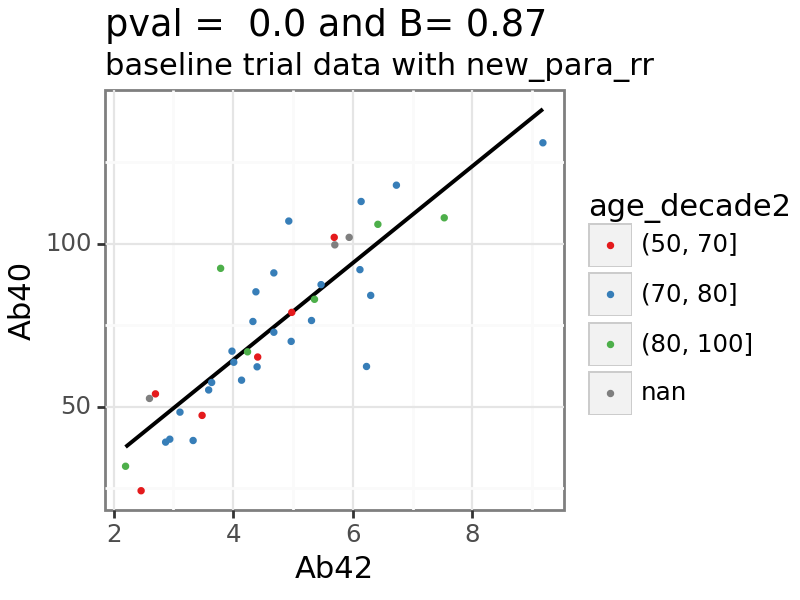

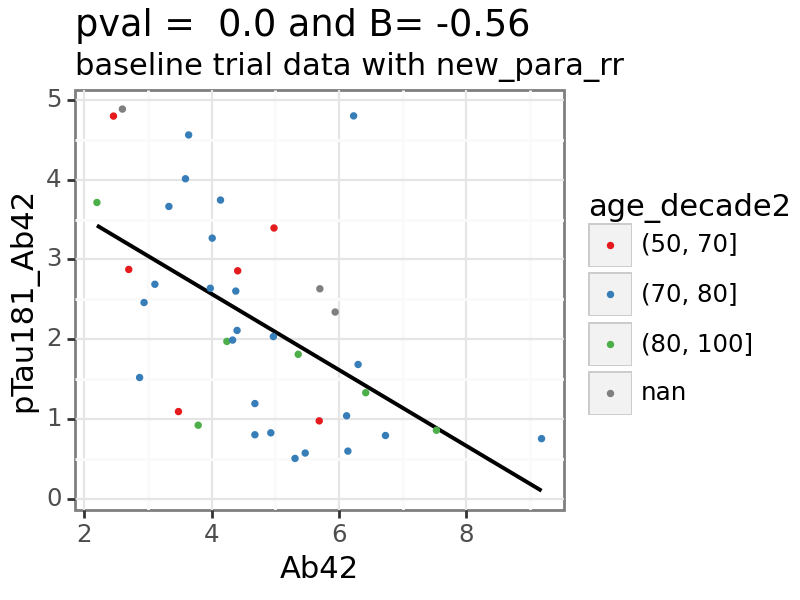

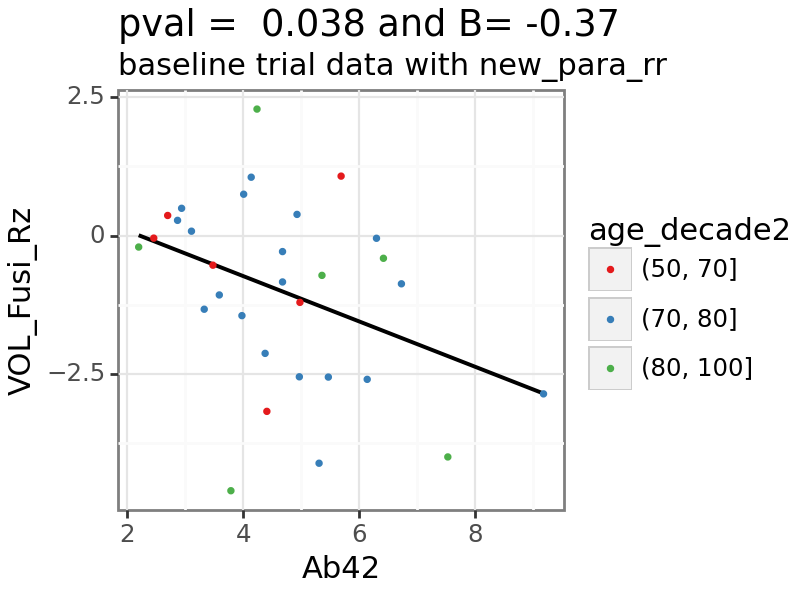

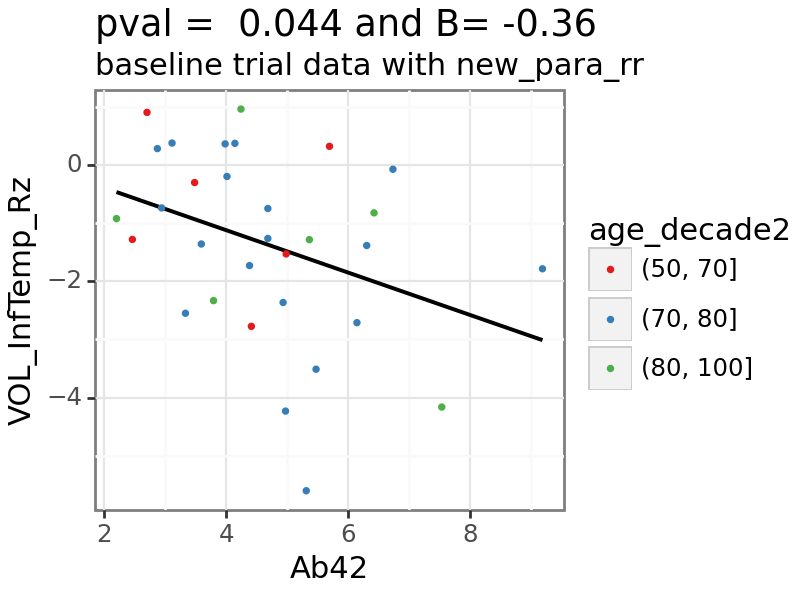

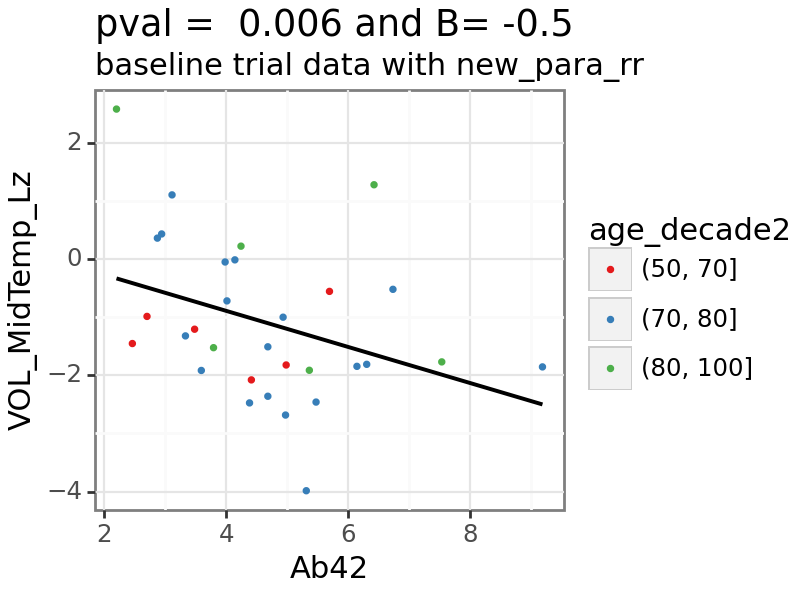

...

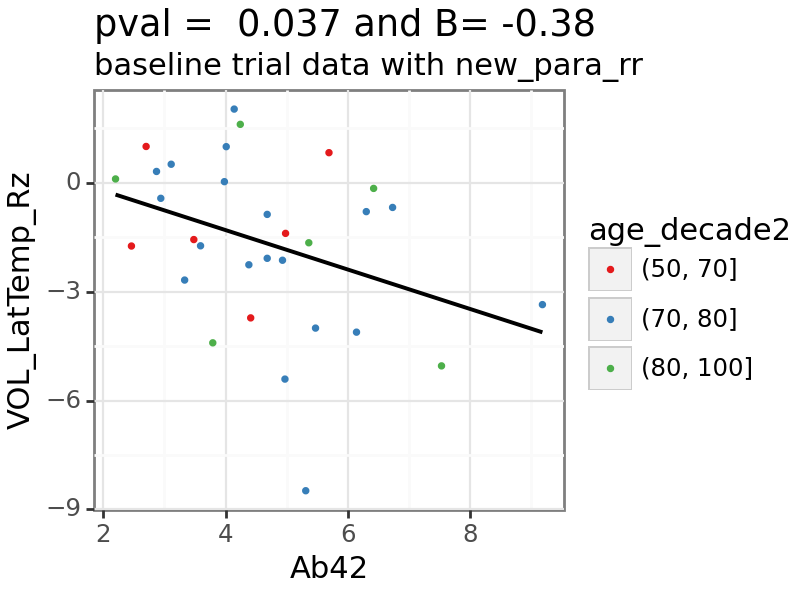

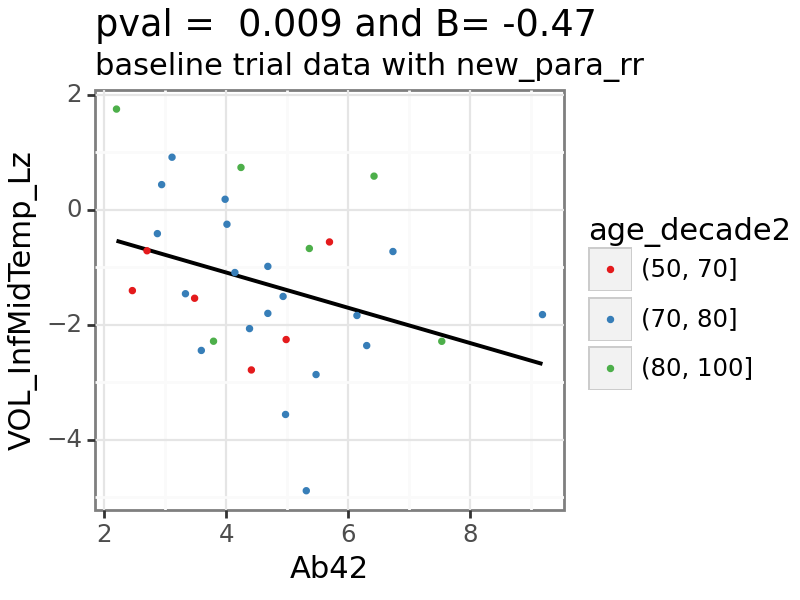

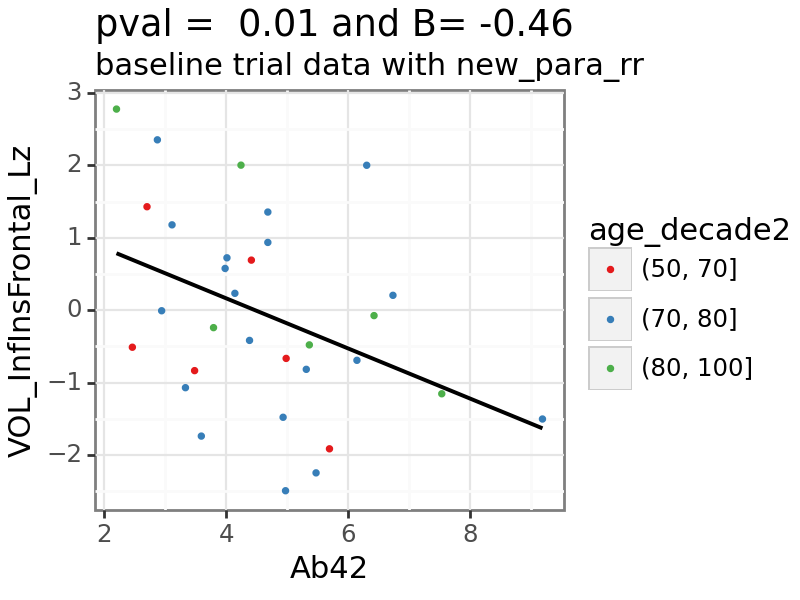

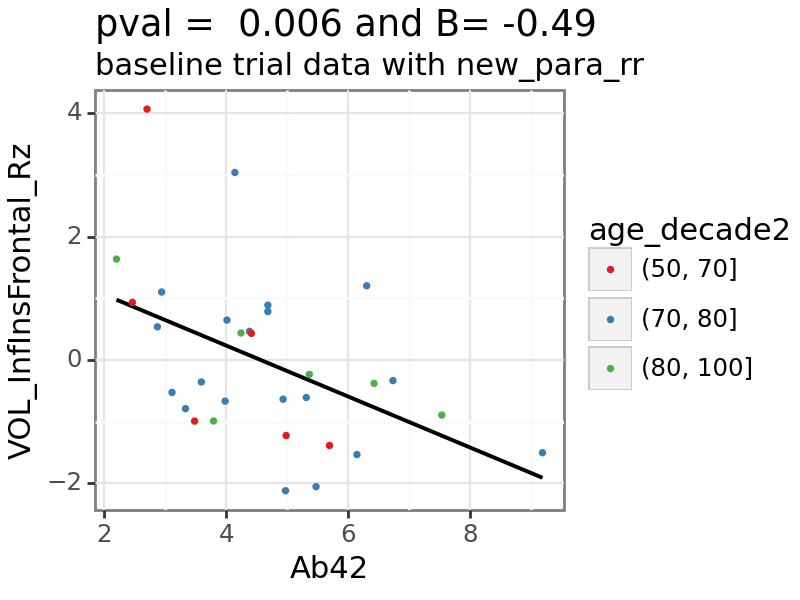

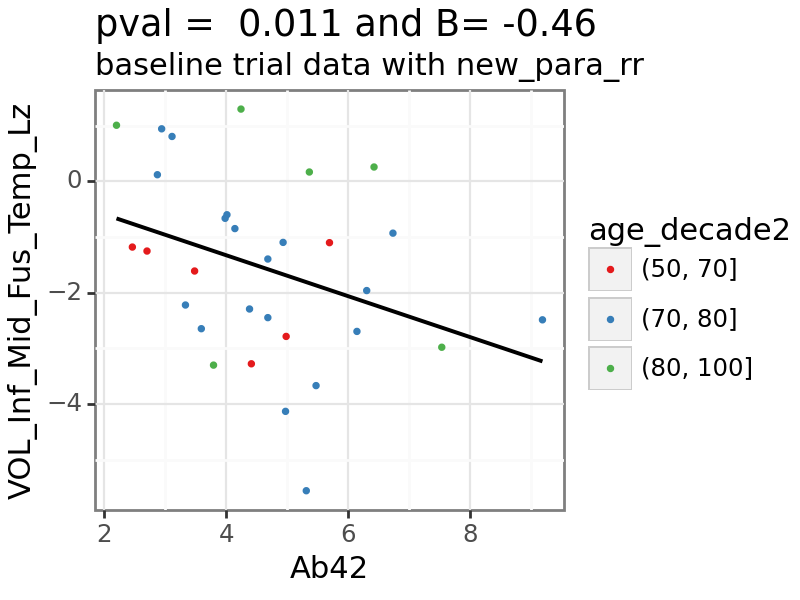

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42_40

In [ ]:
var = 'Ab42_40'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

        var1           var2  cor_p_baseline  cor_r_baseline cor_n  \
20   Ab42_40         MTL_gm           0.016           0.394    37   
24   Ab42_40      Precun_gm           0.132           0.252    37   
18   Ab42_40           Ab40           0.002          -0.488    39   
23   Ab42_40        pTau181           0.251           0.188    39   
25   Ab42_40        pTau231           0.156           0.238    37   
26   Ab42_40   pTau181_Ab42           0.210           0.205    39   
170  Ab42_40  VOL_InfPar_Lz           0.104           0.298    31   

     mv_age_p_baseline  mv_age_B_baseline mv_age_n  mv_ageedu_p_baseline  \
20               0.025              0.376       36                 0.015   
24               0.025              0.372       36                 0.021   
18               0.001             -0.538       36                 0.001   
23               0.011              0.420       36                 0.009   
25               0.004              0.483       34                 

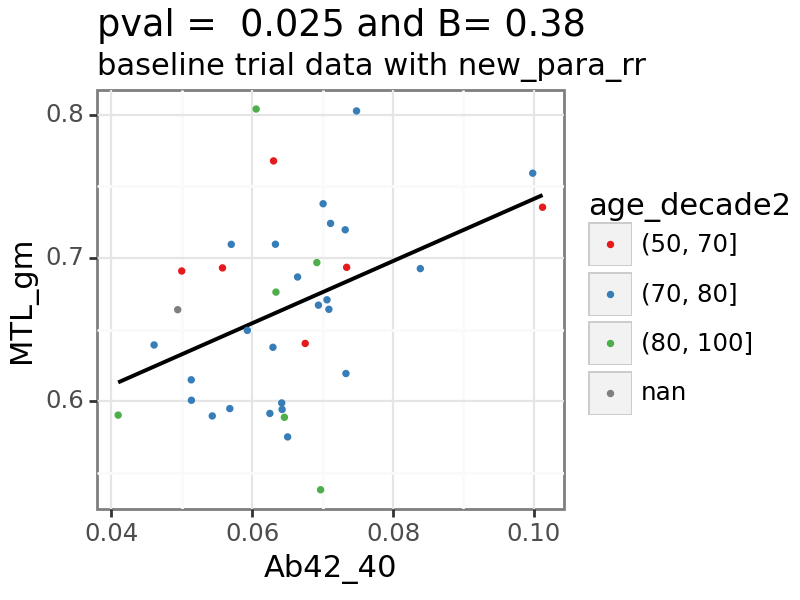

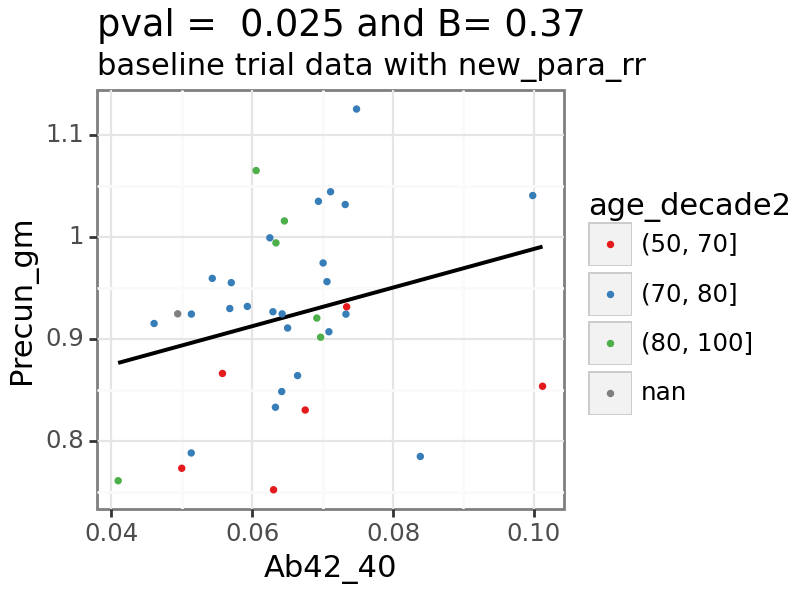

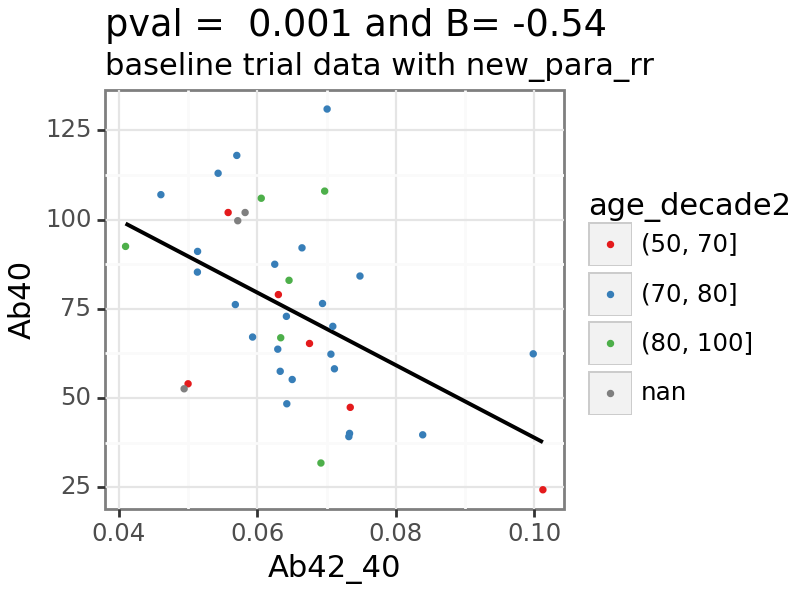

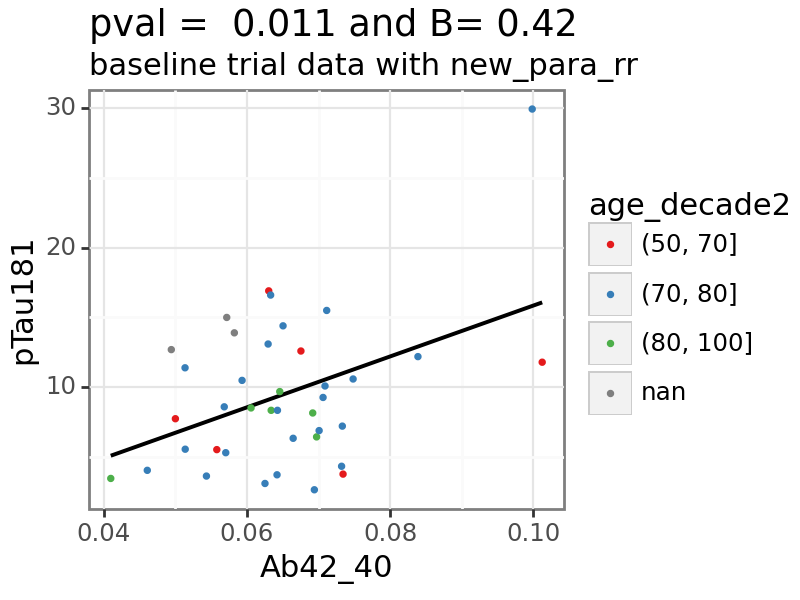

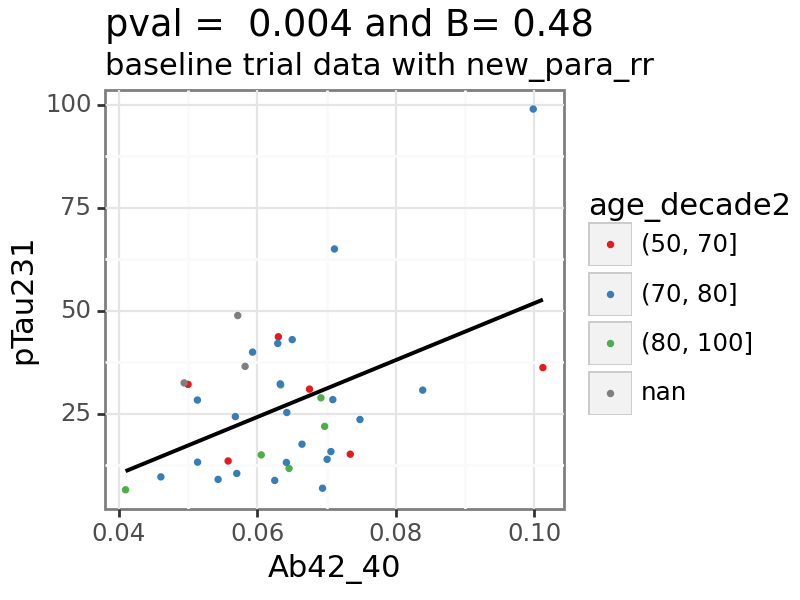

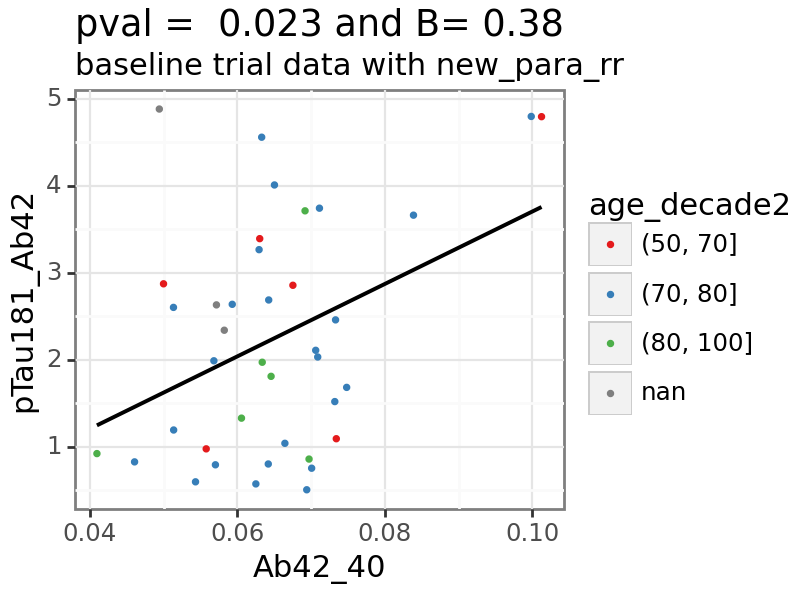

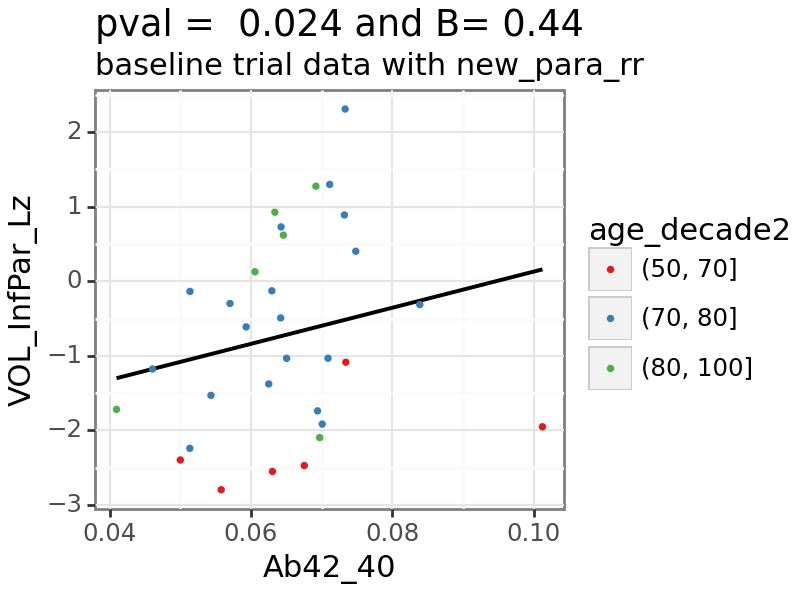

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181


In [ ]:
var = 'pTau181'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

        var1            var2  cor_p_baseline  cor_r_baseline cor_n  \
50   pTau181          MTL_gm           0.015           0.368    43   
47   pTau181         Ab42_40           0.251           0.188    39   
48   pTau181            GFAP           0.028           0.327    45   
49   pTau181             NFL           0.089           0.257    45   
51   pTau181         pTau217           0.001           0.520    40   
52   pTau181         pTau231           0.000           0.906    40   
53   pTau181    pTau181_Ab42           0.000           0.851    39   
64   pTau181             tma           0.023           0.382    35   
69   pTau181        adltotal           0.088           0.281    38   
396  pTau181  VOL_MidTemp_Rz           0.080           0.292    37   
398  pTau181  VOL_SupTemp_Rz           0.068           0.303    37   
421  pTau181   VOL_LatOcc_Lz           0.187           0.222    37   
423  pTau181  VOL_Lingual_Lz           0.092           0.281    37   

     mv_age_p_basel

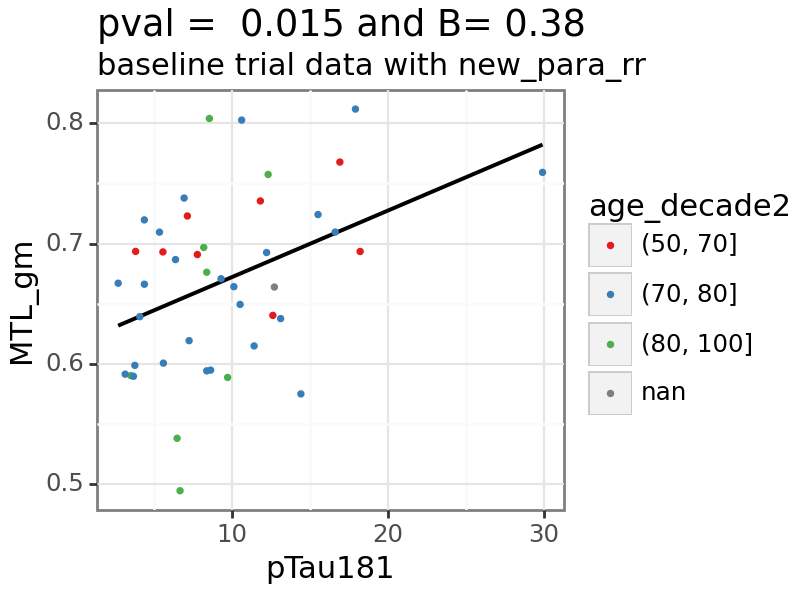

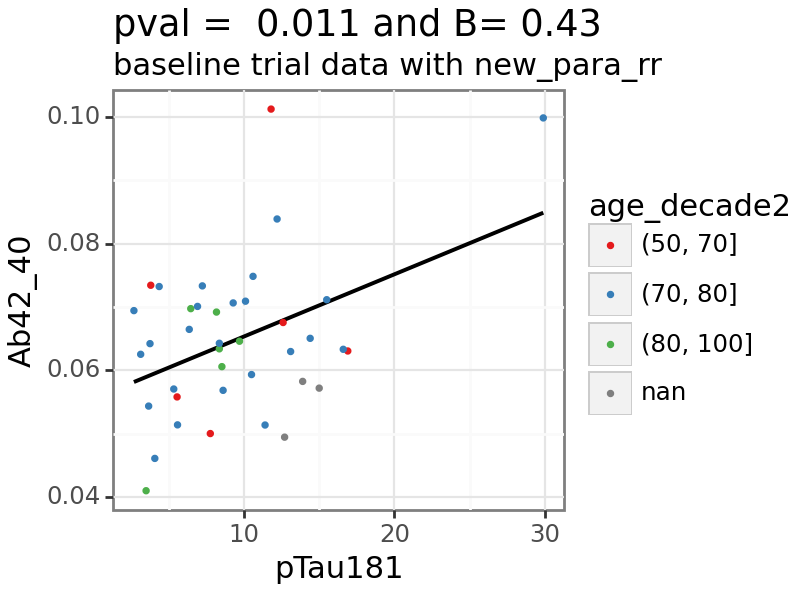

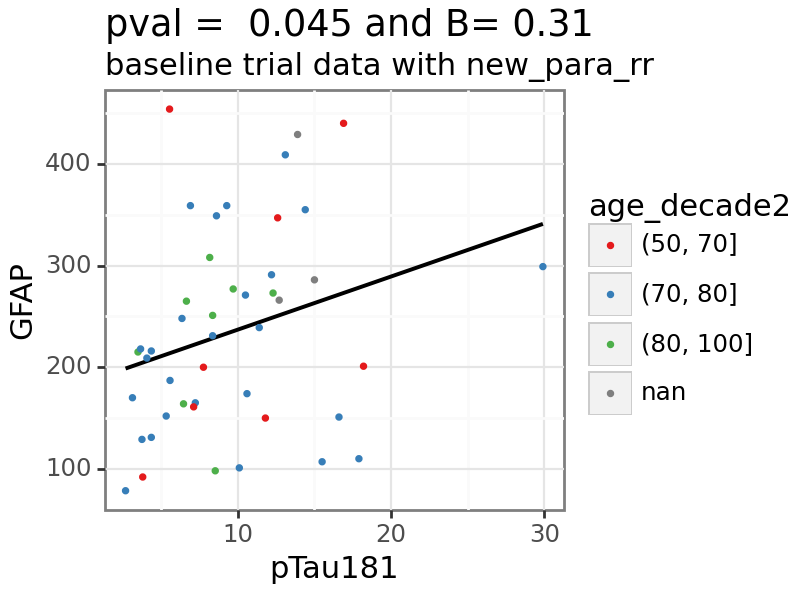

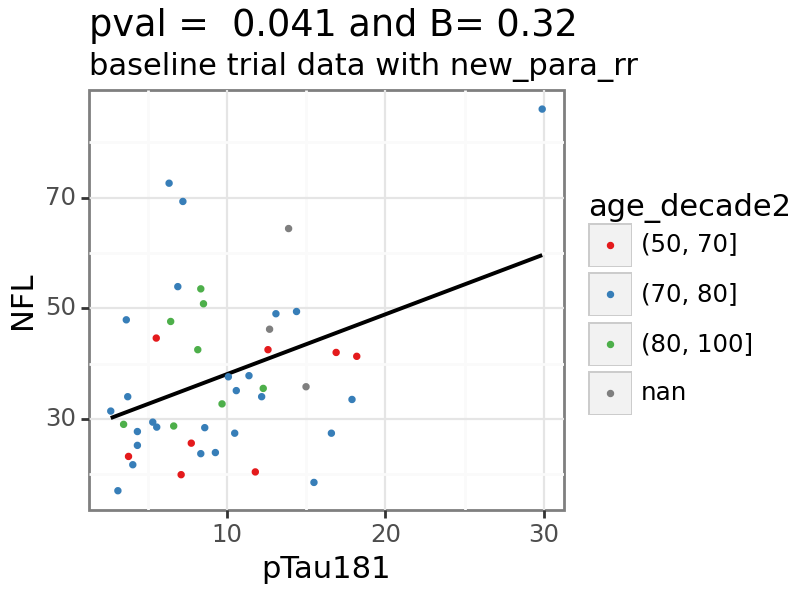

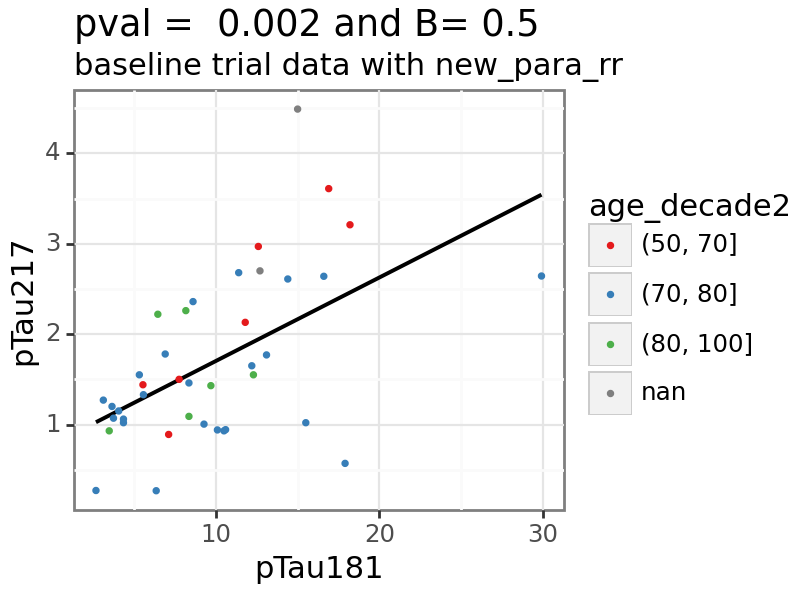

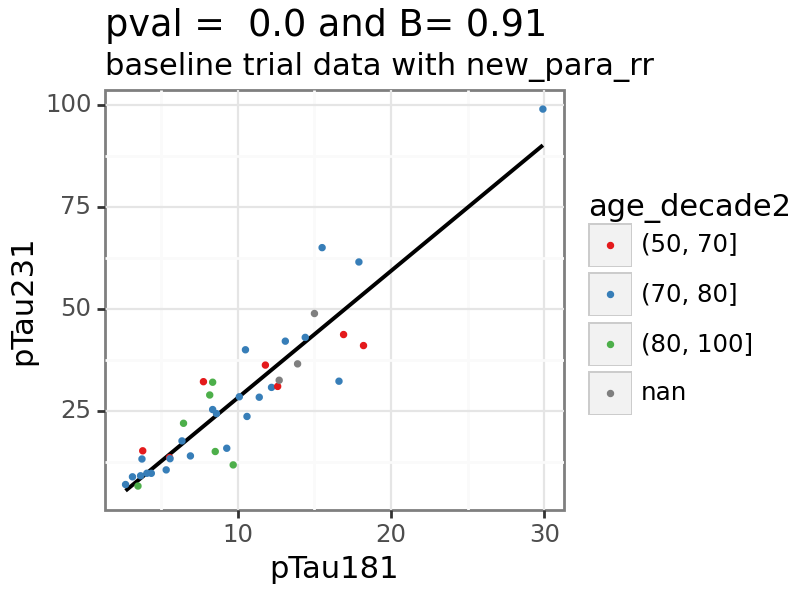

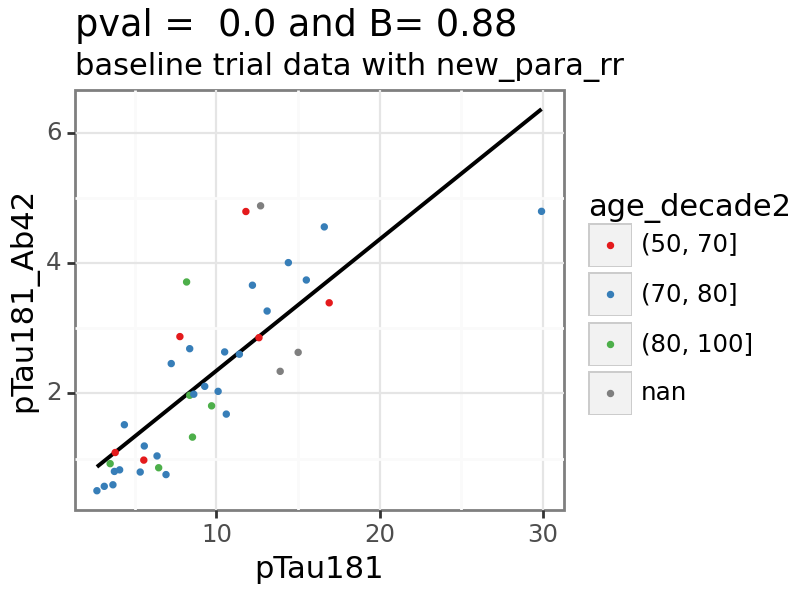

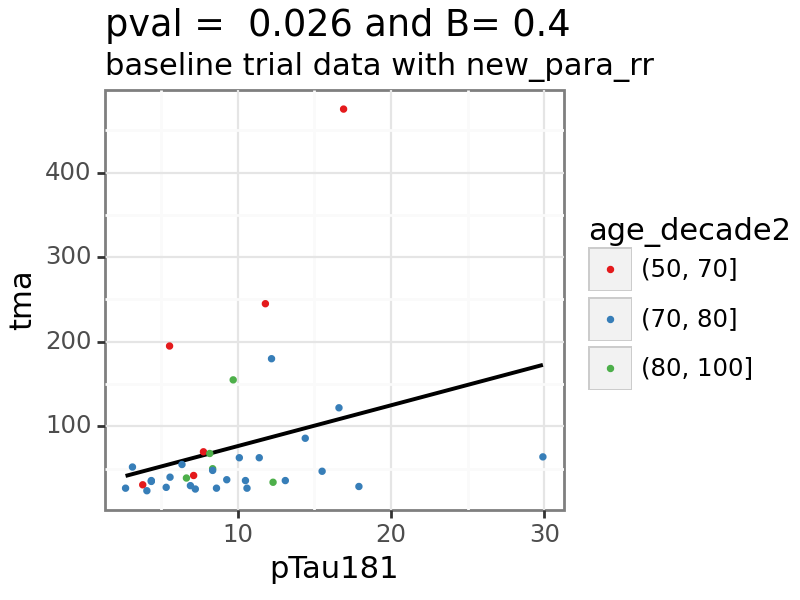

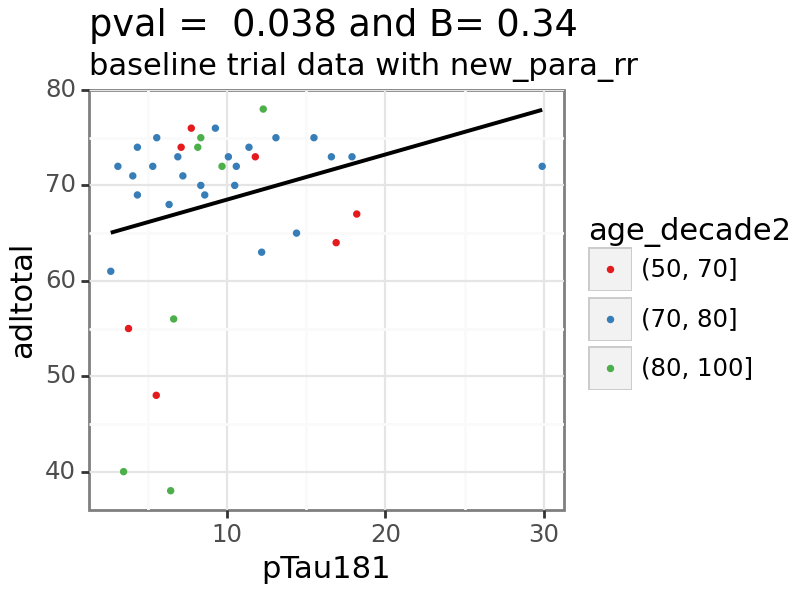

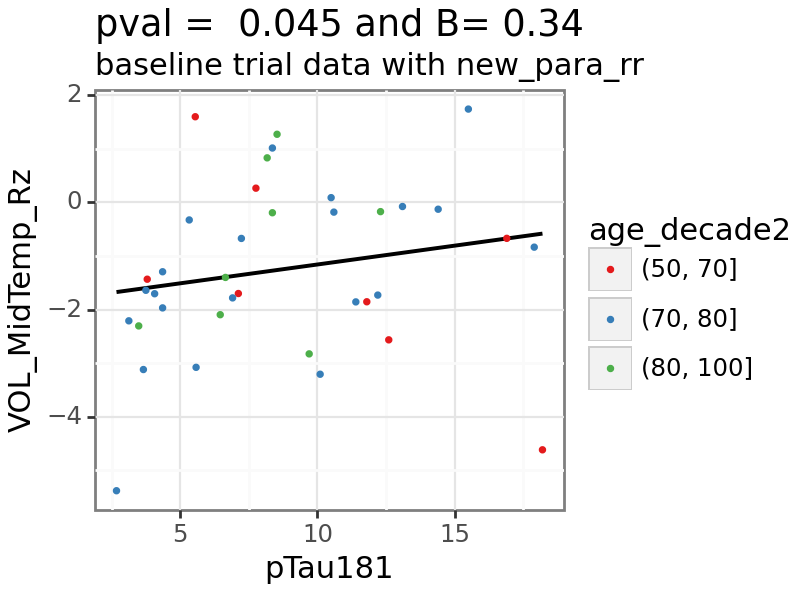

KeyboardInterrupt: 

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

In [ ]:
var = 'pTau217'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

        var1                            var2  cor_p_baseline  cor_r_baseline  \
64   pTau217                       Precun_gm           0.007          -0.428   
65   pTau217                          Par_gm           0.000          -0.551   
67   pTau217                         Temp_gm           0.005          -0.440   
57   pTau217                            GFAP           0.002           0.471   
59   pTau217                         pTau181           0.001           0.520   
61   pTau217                         pTau231           0.005           0.457   
62   pTau217                    pTau181_Ab42           0.001           0.524   
74   pTau217                            bvrt           0.019          -0.399   
76   pTau217                             tma           0.012           0.439   
482  pTau217                VOL_SupraMarg_Lz           0.021          -0.402   
533  pTau217  VOL_Precun_InfPar_Supramarg_Lz           0.005          -0.477   
537  pTau217              VOL_InfParSupr

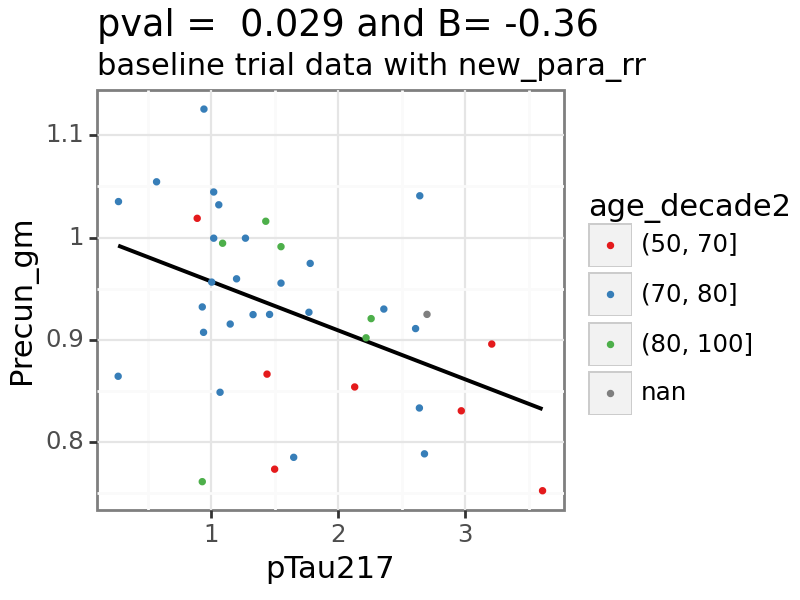

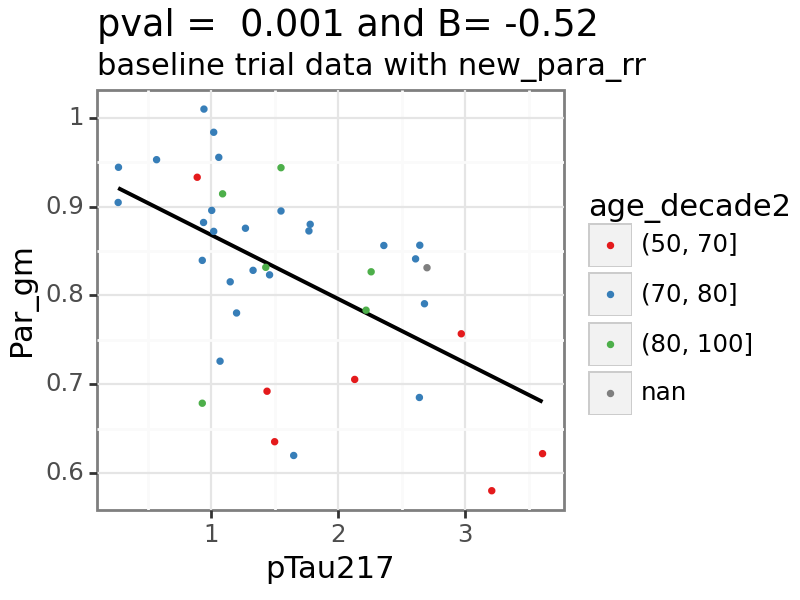

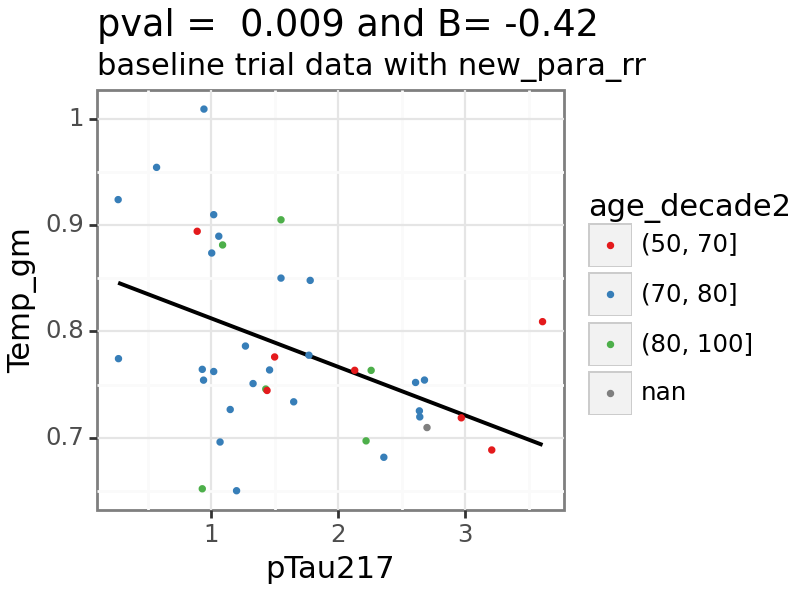

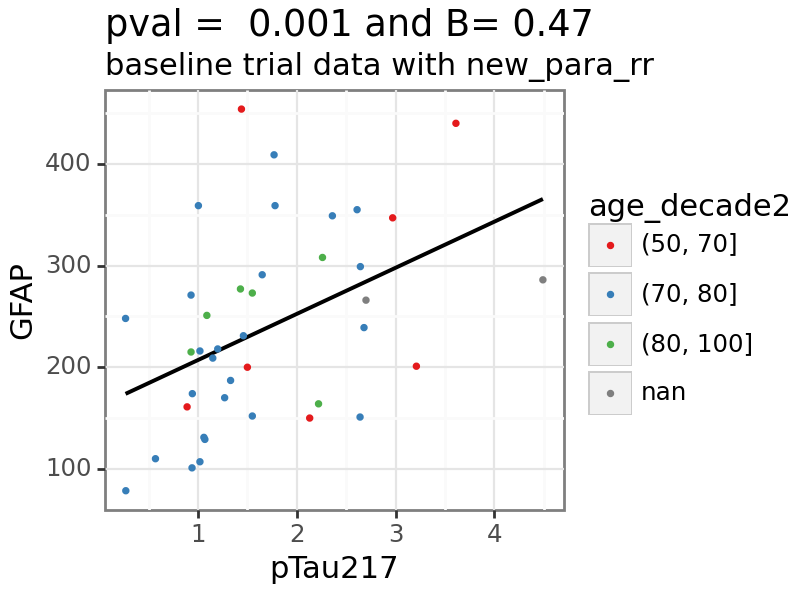

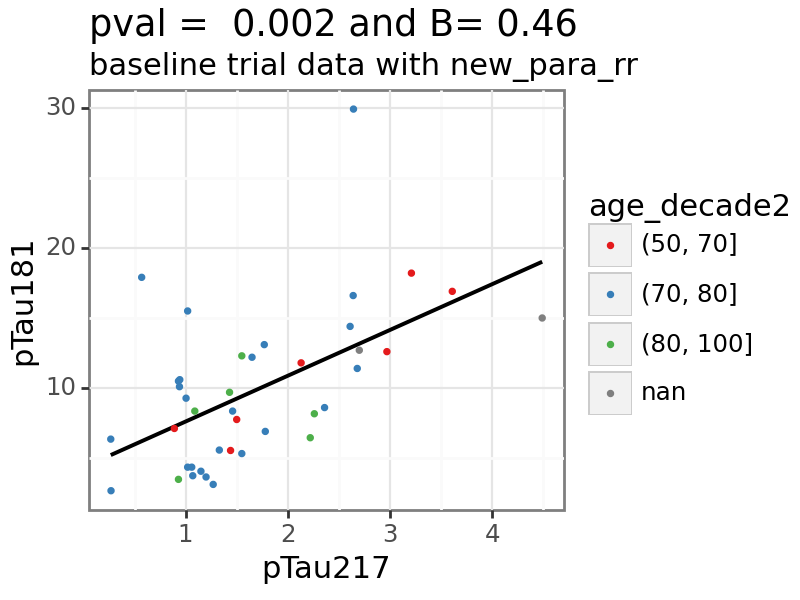

...

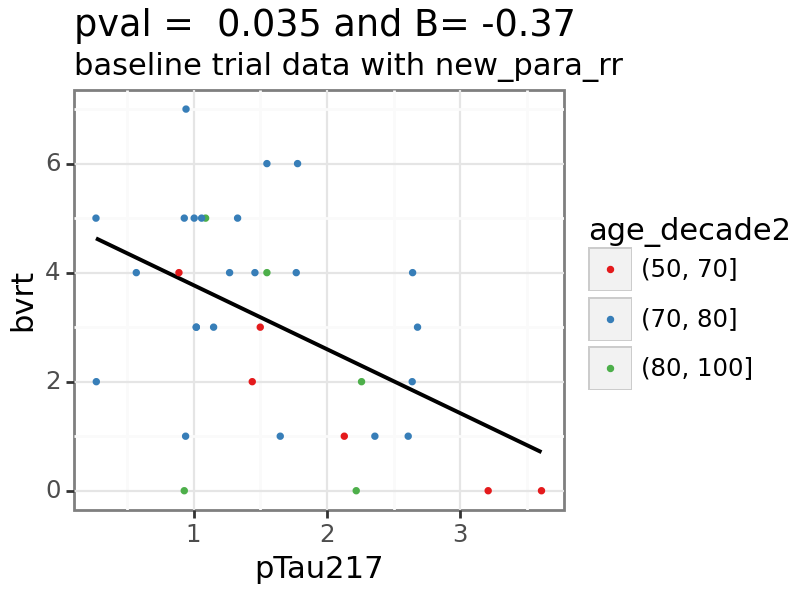

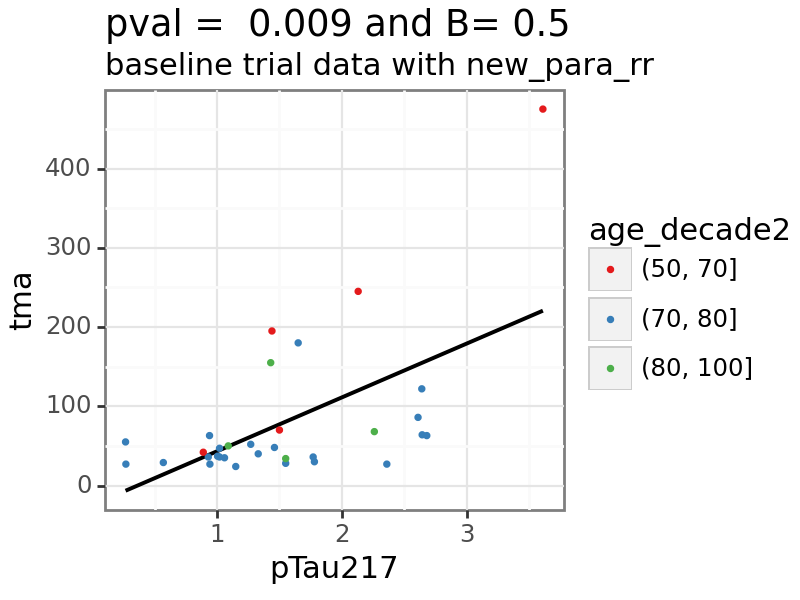

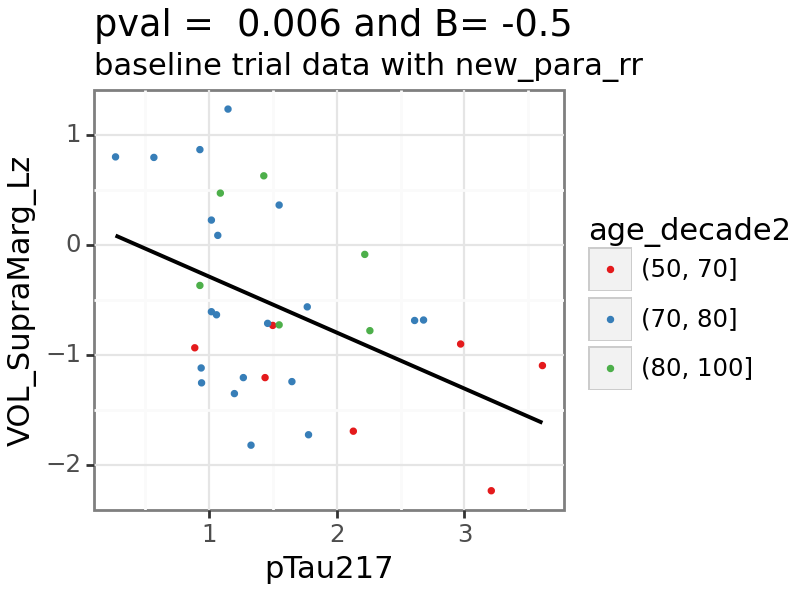

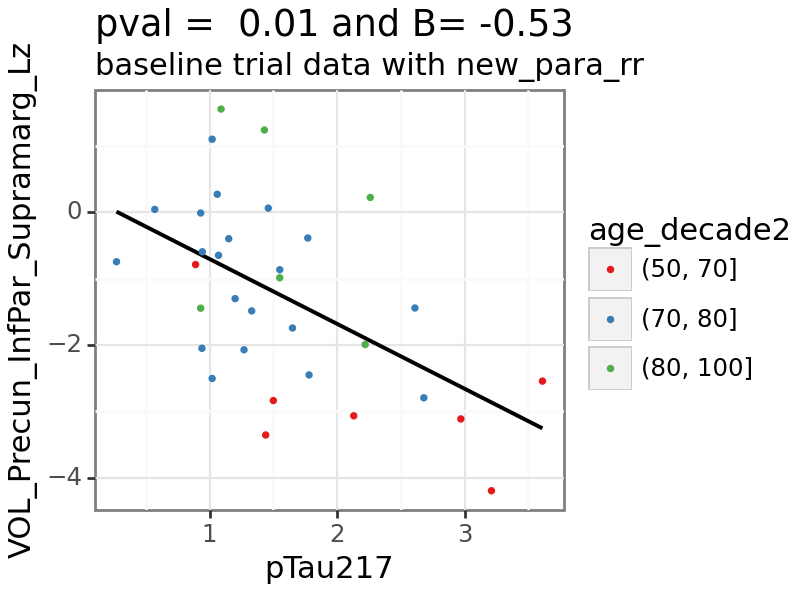

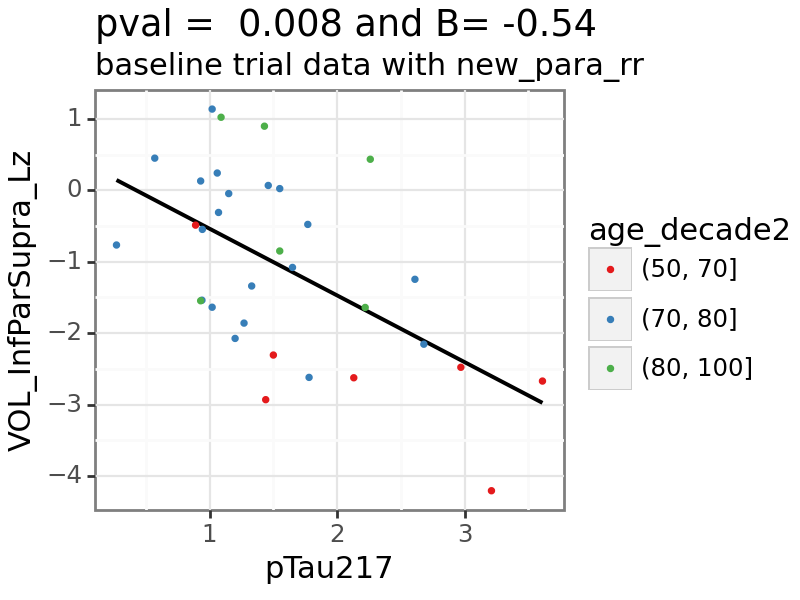

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau231

In [ ]:
var = 'pTau231'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

        var1                            var2  cor_p_baseline  cor_r_baseline  \
70   pTau231                          MTL_gm           0.025           0.359   
63   pTau231                            Ab40           0.001          -0.533   
65   pTau231                         Ab42_40           0.156           0.238   
68   pTau231                         pTau181           0.000           0.906   
69   pTau231                         pTau217           0.005           0.457   
71   pTau231                    pTau181_Ab42           0.000           0.871   
546  pTau231                     VOL_Fusi_Rz           0.047           0.349   
550  pTau231                  VOL_MidTemp_Rz           0.010           0.443   
551  pTau231                  VOL_SupTemp_Lz           0.007           0.460   
552  pTau231                  VOL_SupTemp_Rz           0.006           0.466   
555  pTau231                   VOL_InfPar_Lz           0.332           0.174   
563  pTau231               VOL_OrbitFron

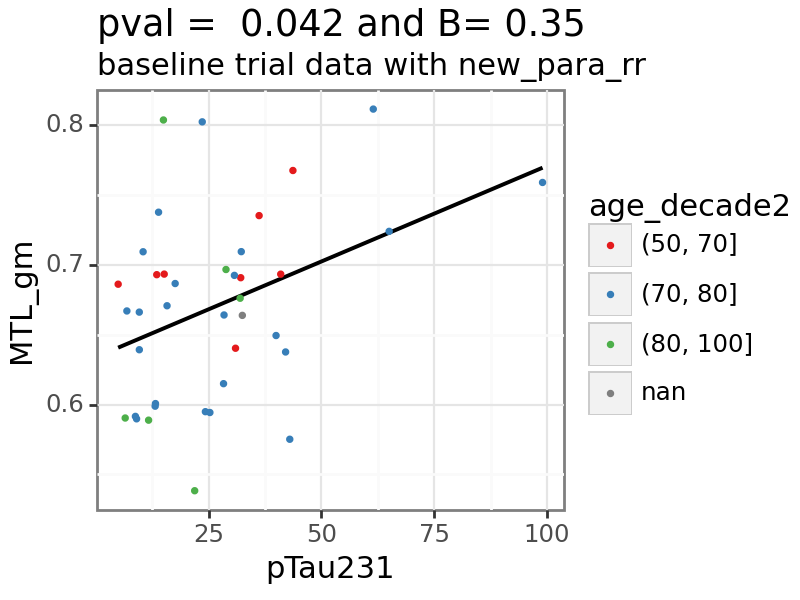

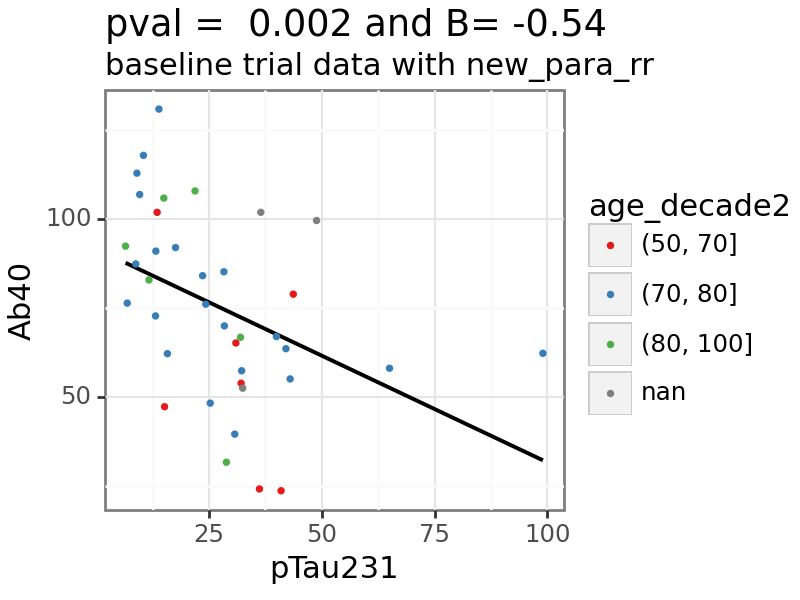

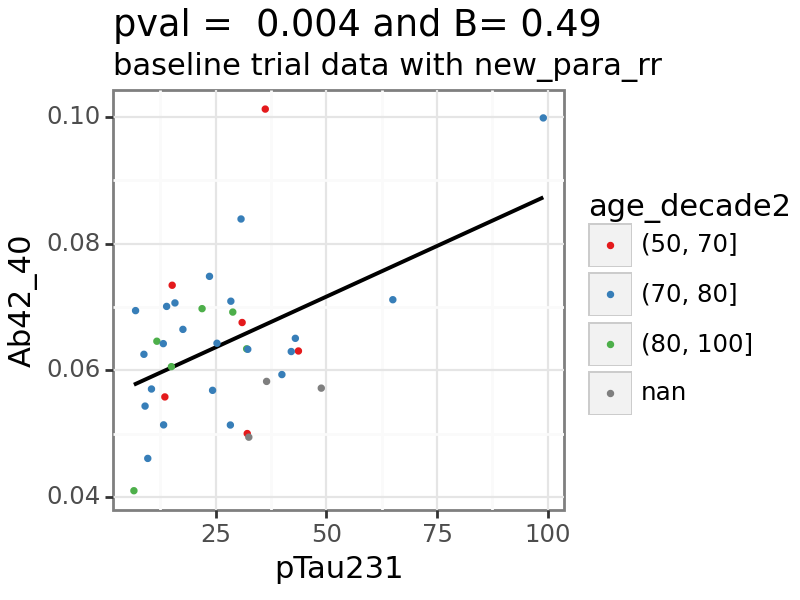

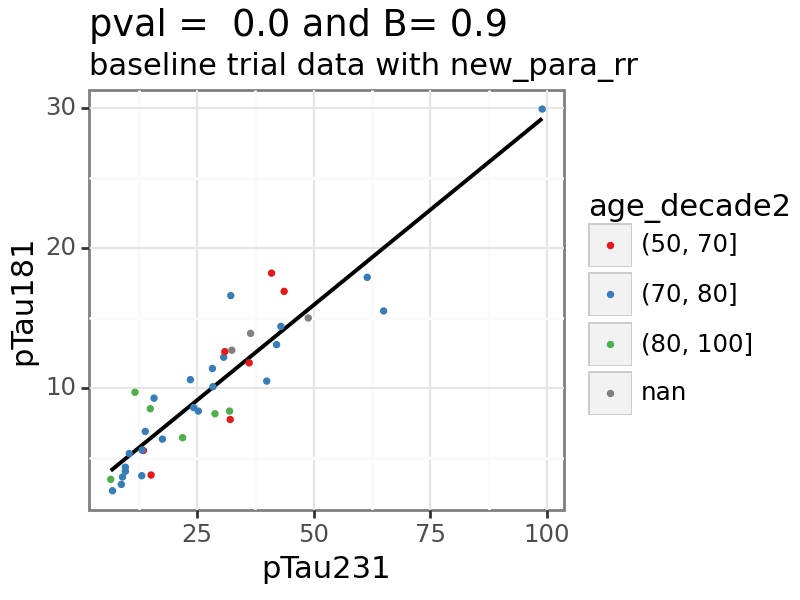

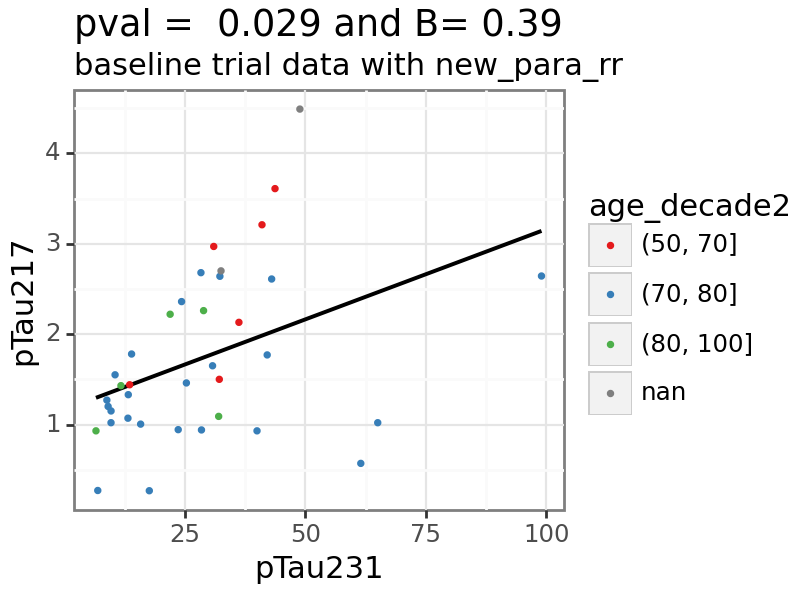

...

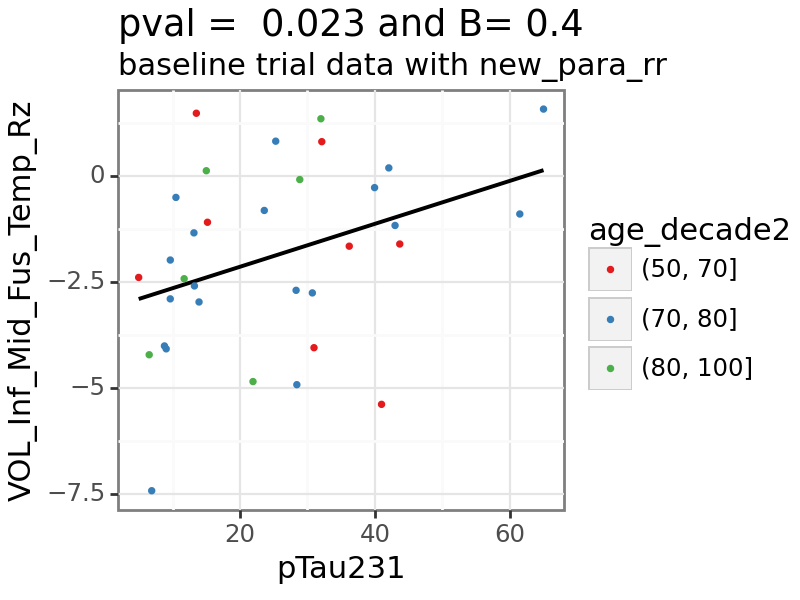

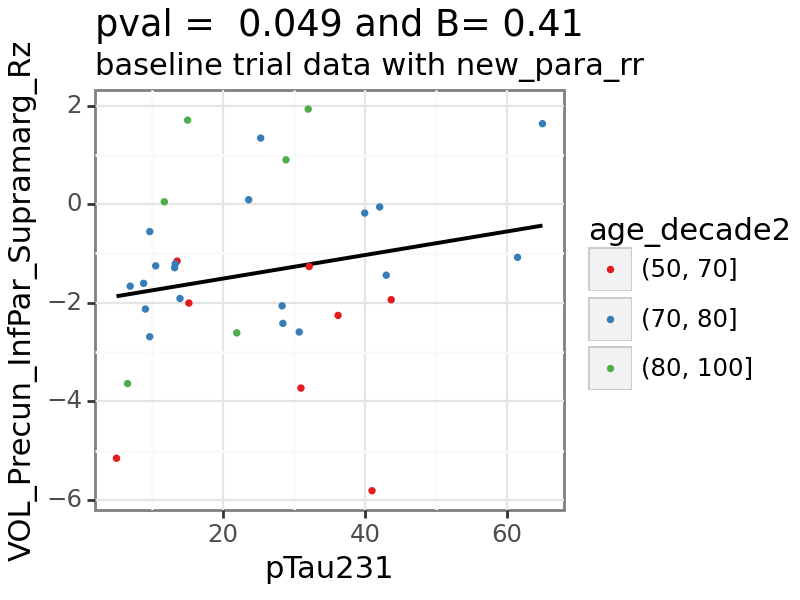

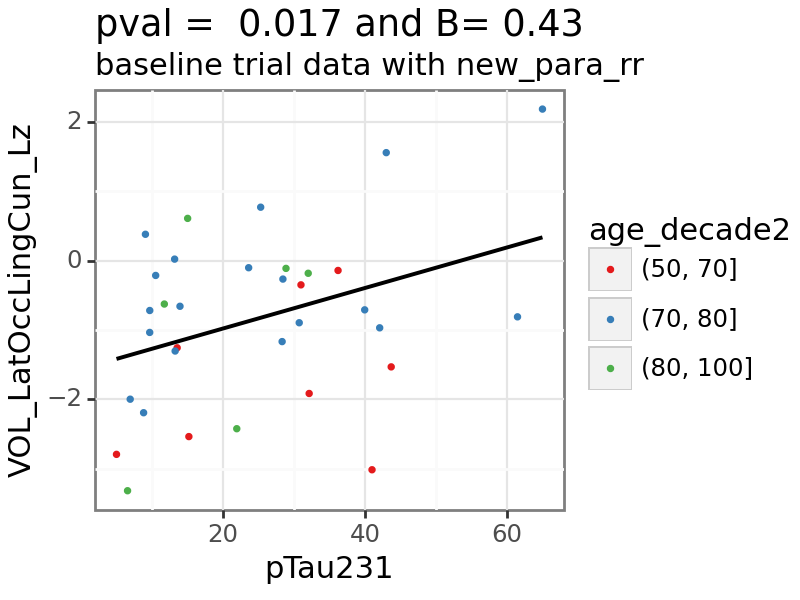

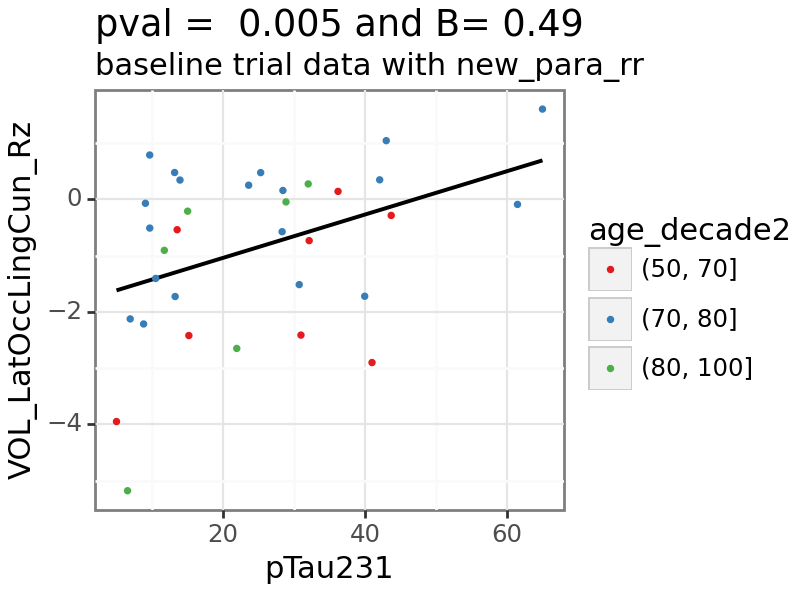

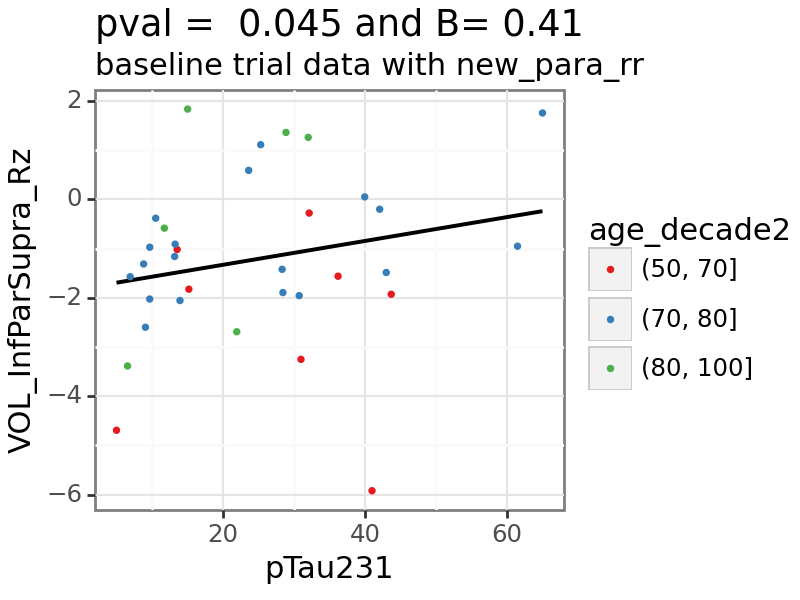

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

In [ ]:
var = 'GFAP'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

     var1                 var2  cor_p_baseline  cor_r_baseline cor_n  \
32   GFAP           FRONTAL_gm           0.034          -0.324    43   
34   GFAP            Precun_gm           0.099          -0.255    43   
35   GFAP               Par_gm           0.085          -0.265    43   
36   GFAP           RASref1_gm           0.031          -0.329    43   
31   GFAP                  NFL           0.005           0.409    45   
32   GFAP              pTau181           0.028           0.327    45   
33   GFAP              pTau217           0.002           0.471    40   
36   GFAP                 MMSE           0.096          -0.274    38   
39   GFAP              dstotal           0.023          -0.368    38   
40   GFAP                  tma           0.088           0.293    35   
44   GFAP               cdrsum           0.078           0.289    38   
235  GFAP       VOL_ParaHip_Lz           0.020           0.382    37   
251  GFAP     VOL_SupraMarg_Lz           0.170          -0.231  

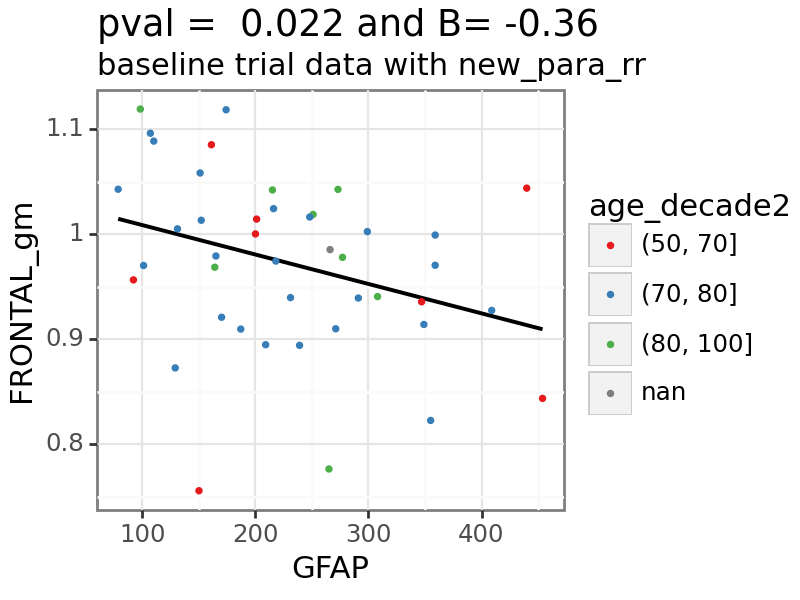

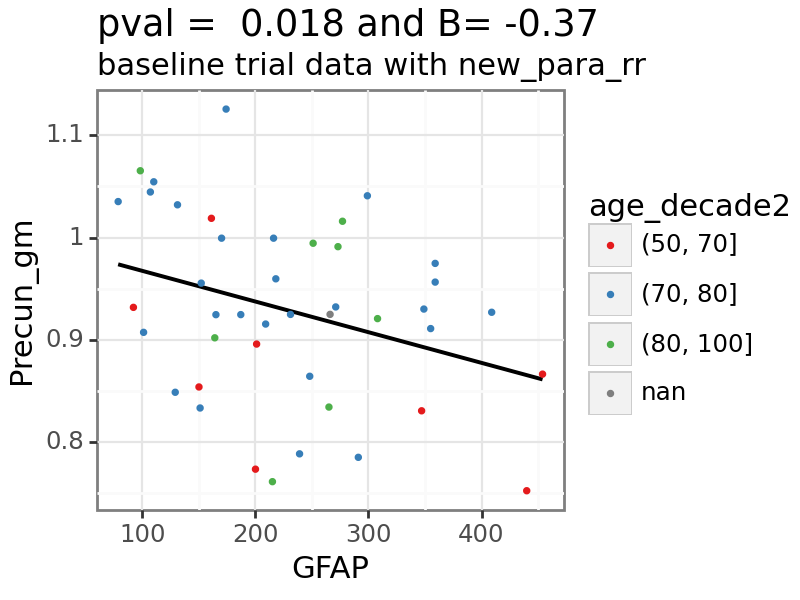

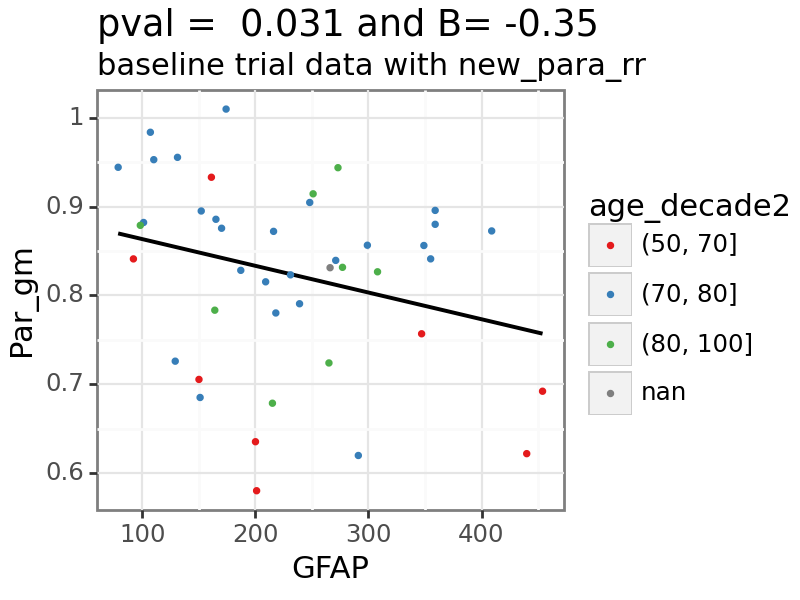

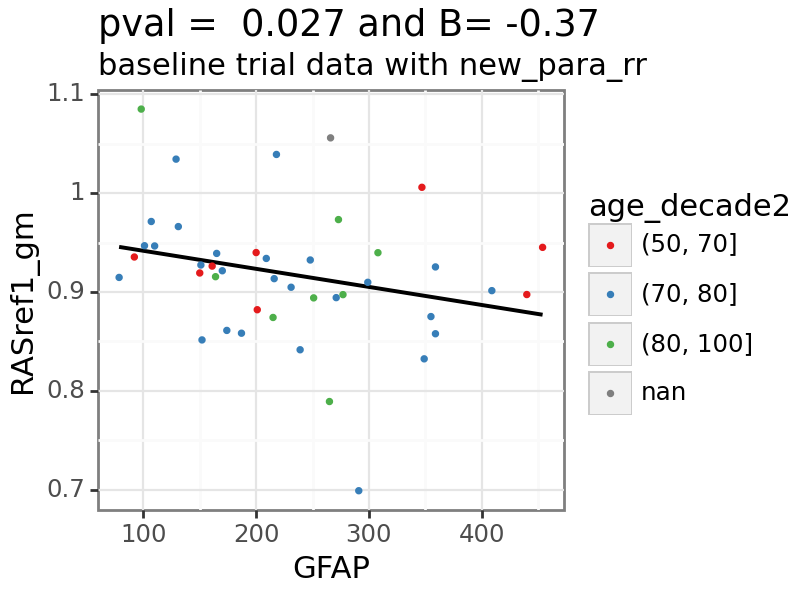

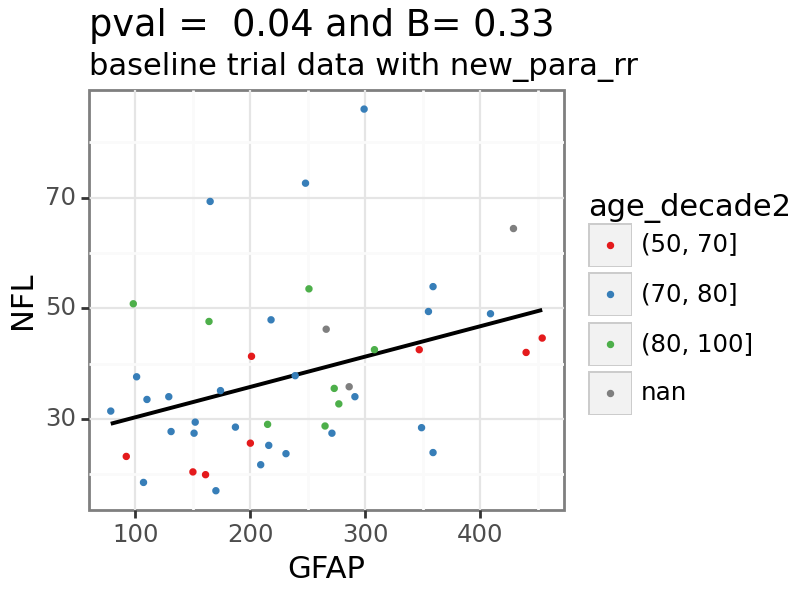

...

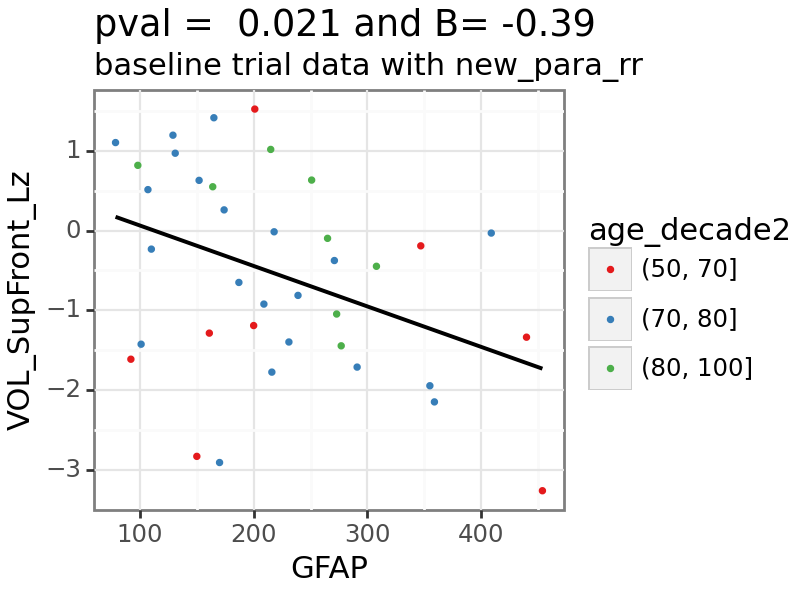

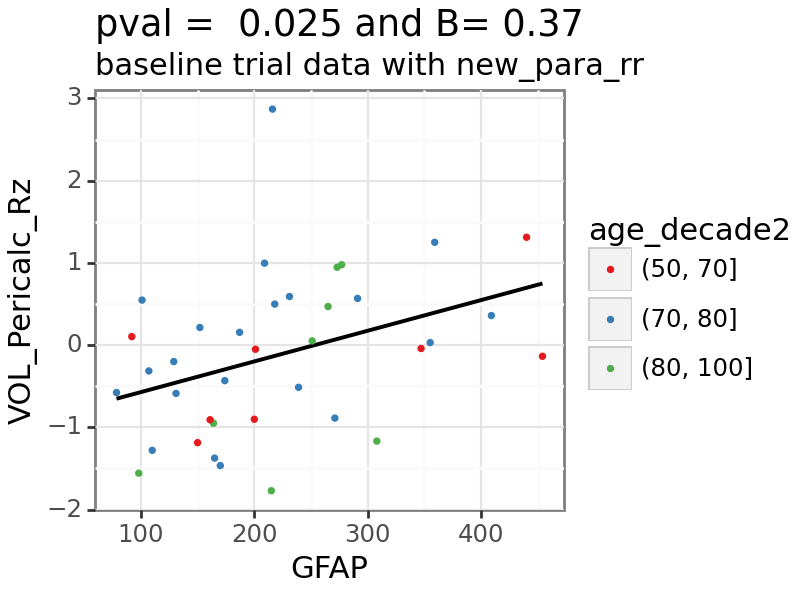

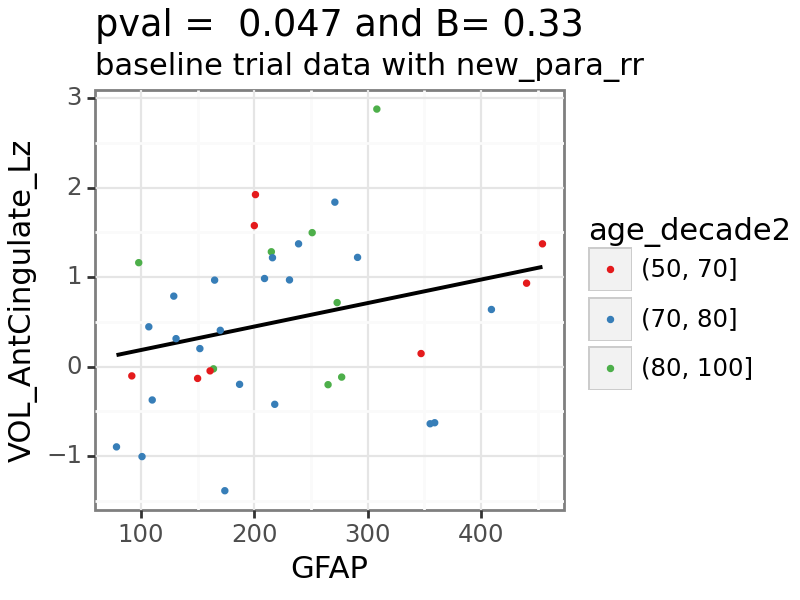

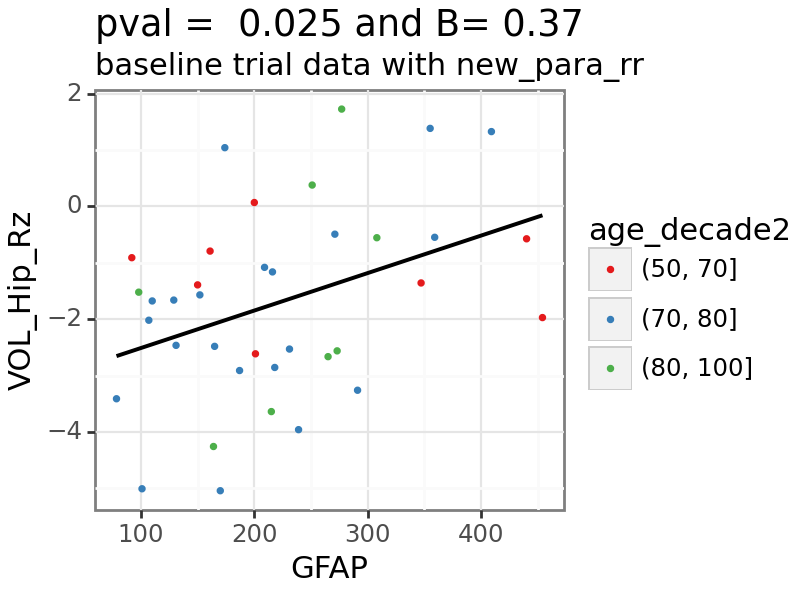

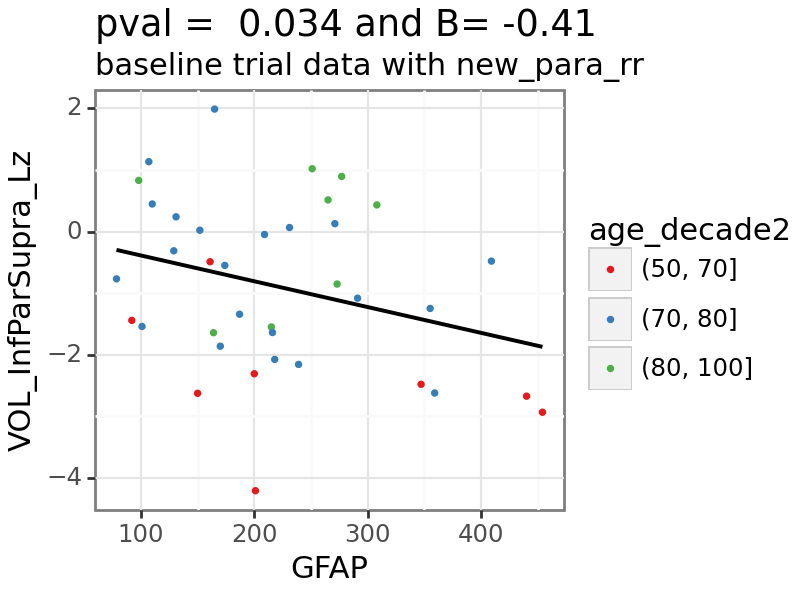

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

In [ ]:
var = 'NFL'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

    var1               var2  cor_p_baseline  cor_r_baseline cor_n  \
39   NFL               GFAP           0.005           0.409    45   
41   NFL            pTau181           0.089           0.257    45   
309  NFL  VOL_Ventricles_Rz           0.083           0.289    37   
358  NFL         VOL_Hip_Lz           0.093           0.280    37   

     mv_age_p_baseline  mv_age_B_baseline mv_age_n  mv_ageedu_p_baseline  \
39               0.040              0.319       42                 0.029   
41               0.041              0.318       42                 0.029   
309              0.050              0.324       37                 0.136   
358              0.049              0.324       37                 0.110   

     mv_ageedi_B_baseline mv_ageedu_n  mv_aeasr_p_baseline  \
39                  0.378          38                0.010   
41                  0.373          38                0.039   
309                 0.280          33                0.142   
358                 0.269

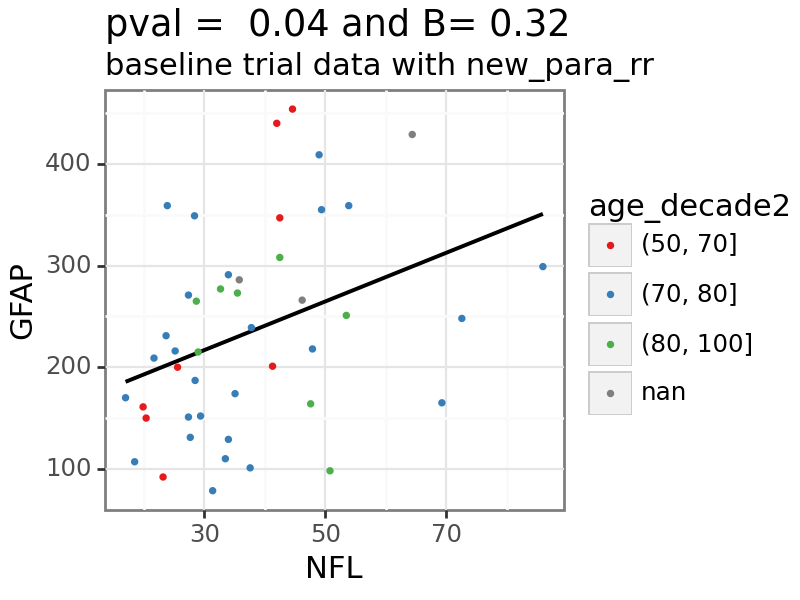

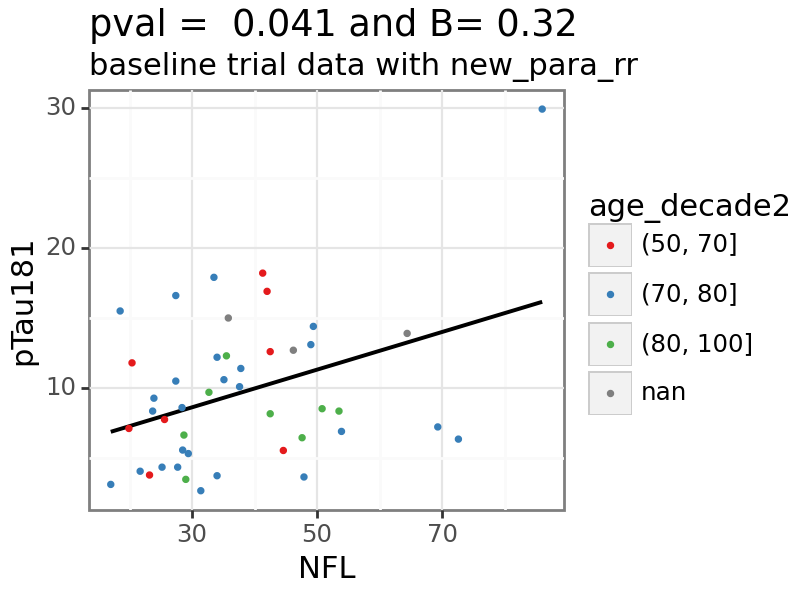

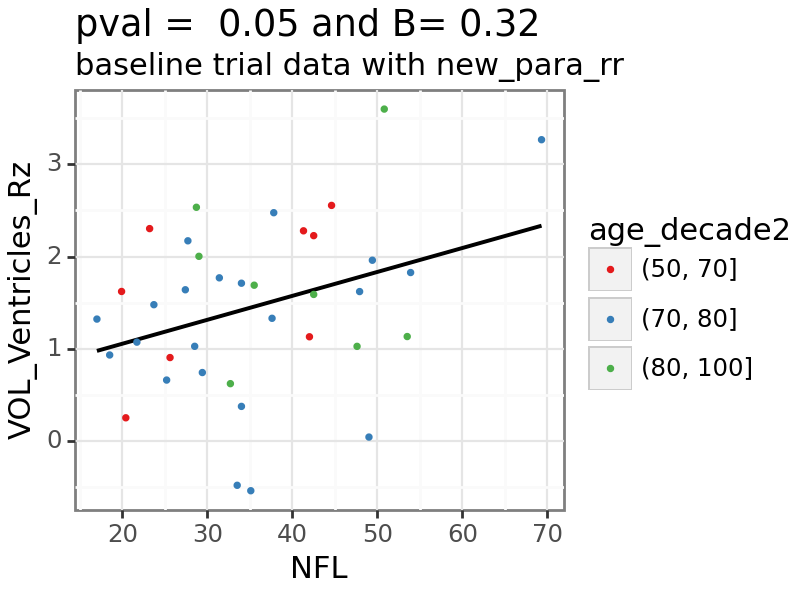

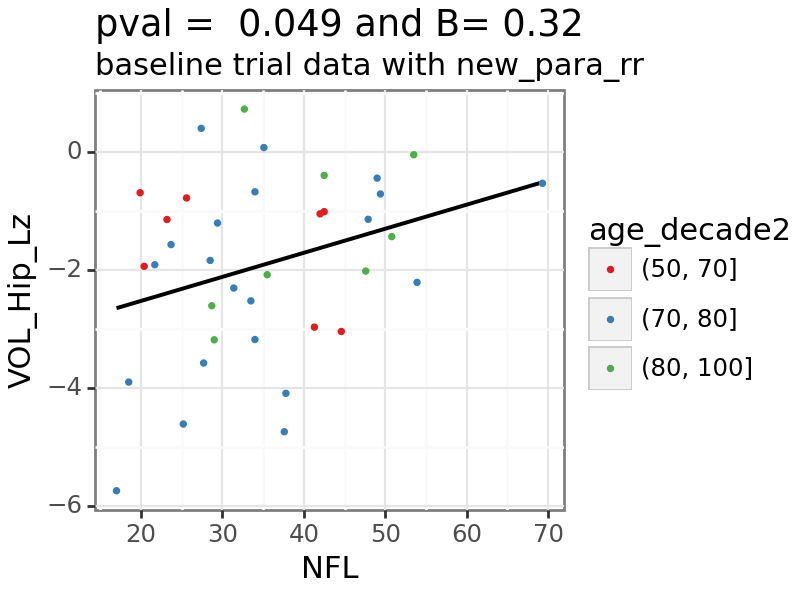

In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181_Ab42_40

In [ ]:
var = 'pTau181_Ab42_40'

In [ ]:
print(biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), :].round(3))

Empty DataFrame
Columns: [var1, var2, cor_p_baseline, cor_r_baseline, cor_n, mv_age_p_baseline, mv_age_B_baseline, mv_age_n, mv_ageedu_p_baseline, mv_ageedi_B_baseline, mv_ageedu_n, mv_aeasr_p_baseline, mv_aeasr_B_baseline, mv_aeasr_n, type]
Index: []


In [ ]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']
for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Exploring the relationships that have the opposite direction than what we expect : checking if other factors can explain

In [ ]:
baseline_trial_data['MMSE_bin'] = pd.qcut(baseline_trial_data['MMSE'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['cdrsum_bin'] = pd.qcut(baseline_trial_data['cdrsum'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['Ab42_40_log10_bin'] = pd.qcut(baseline_trial_data['Ab42_40_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['pTau217_log10_bin'] = pd.qcut(baseline_trial_data['pTau217_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['GFAP_log10_bin'] = pd.qcut(baseline_trial_data['GFAP_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['NFL_log10_bin'] = pd.qcut(baseline_trial_data['NFL_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['VOL_Hip_Rz_bin'] = pd.qcut(baseline_trial_data['VOL_Hip_Rz'], [0, .33, .66, 1.], precision = 2).astype('str')

C:\Users\Lauren.Koenig\AppData\Local\Temp\3\ipykernel_19020\4187745018.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\3\ipykernel_19020\4187745018.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\3\ipykernel_19020\4187745018.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

## Do we see the relationships for all age groups

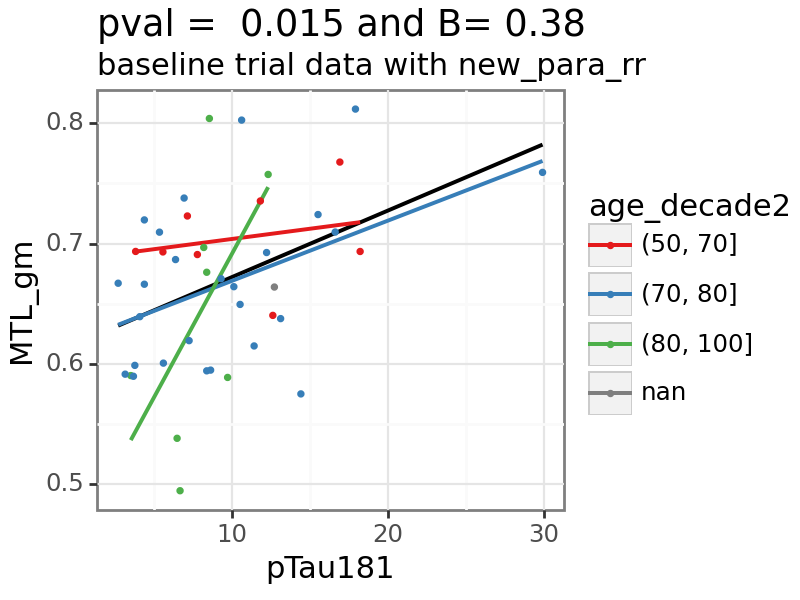

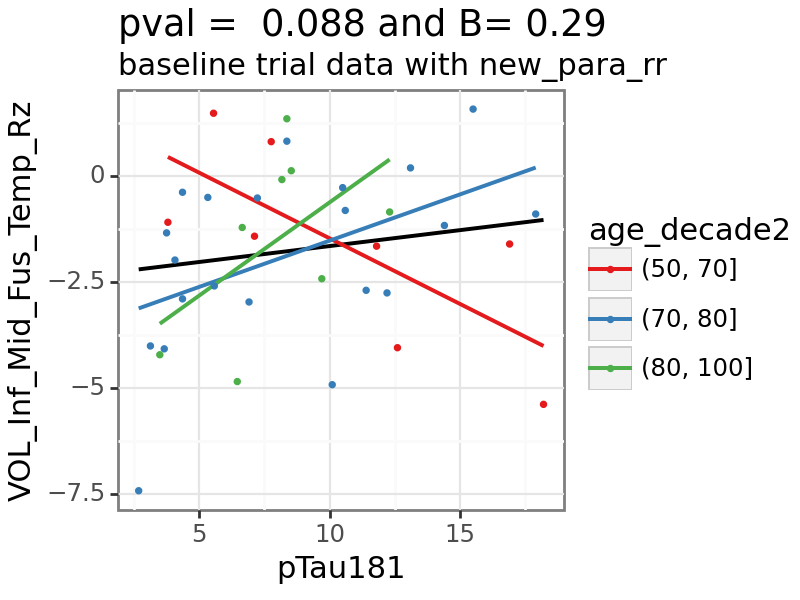

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all CDR sum of boxes

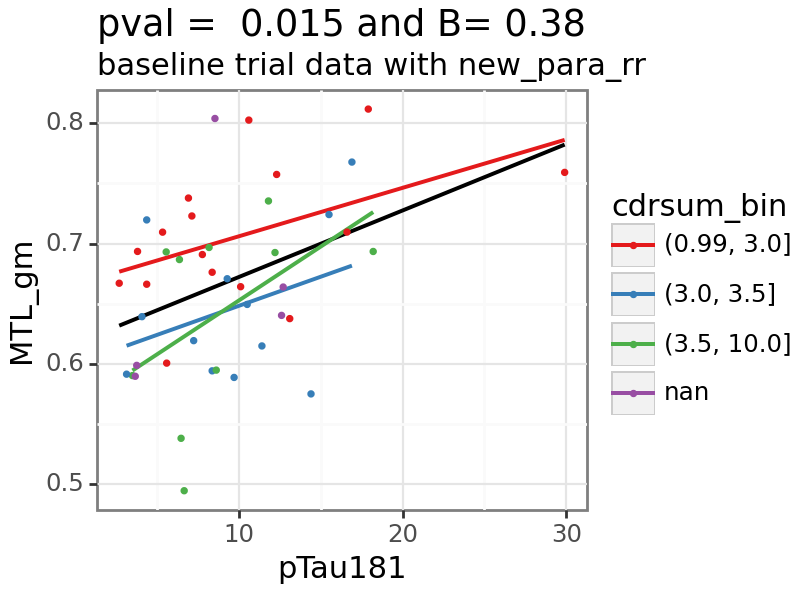

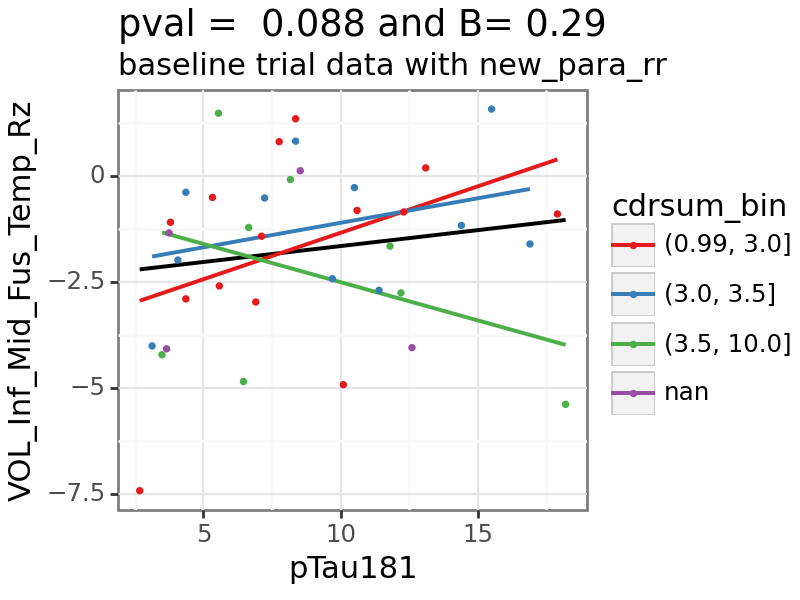

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrsum_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'cdrsum_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all CDR 

C:\Users\Lauren.Koenig\AppData\Local\Temp\3\ipykernel_19020\1599349144.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


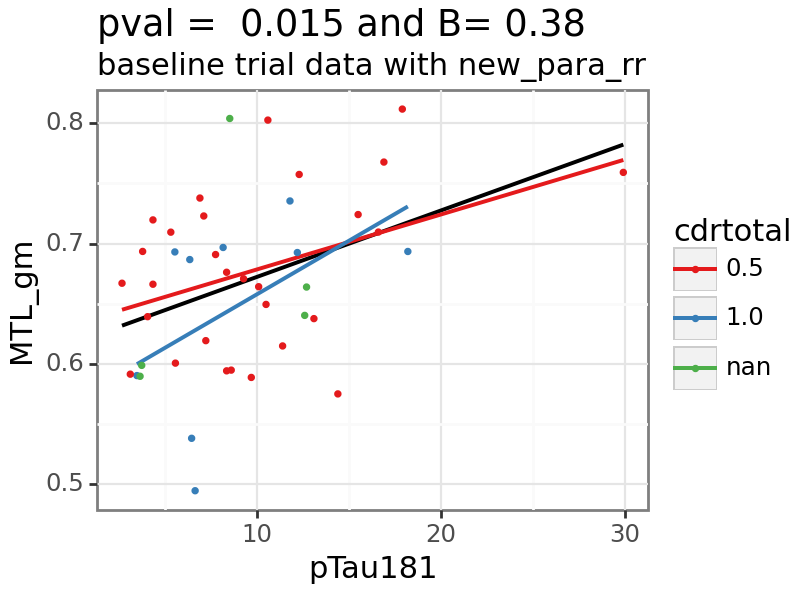

C:\Users\Lauren.Koenig\AppData\Local\Temp\3\ipykernel_19020\1599349144.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


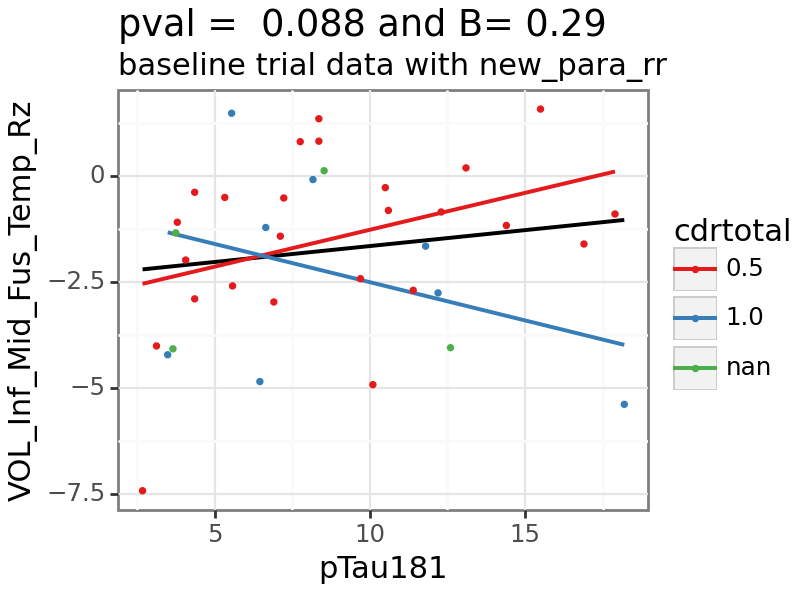

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data['cdrtotal'] = subset_data['cdrtotal'].astype('str')
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrtotal', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'cdrtotal'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all MMSE

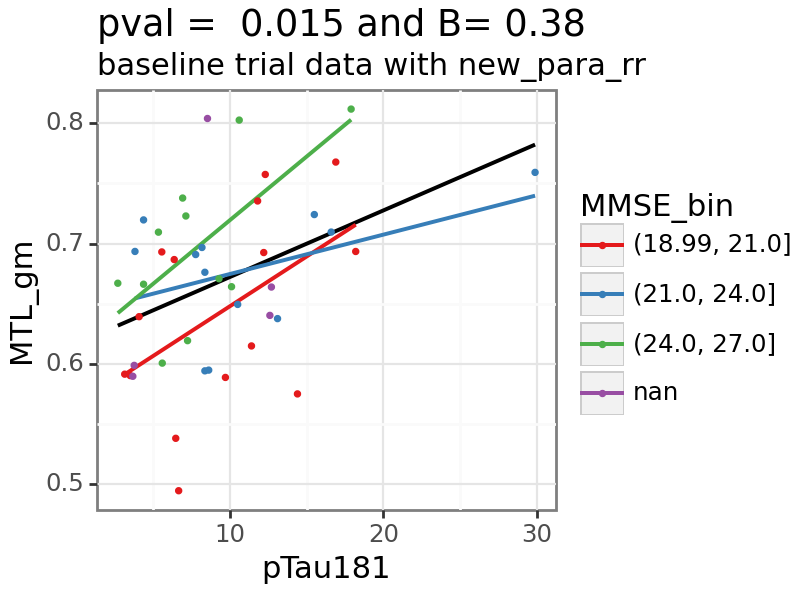

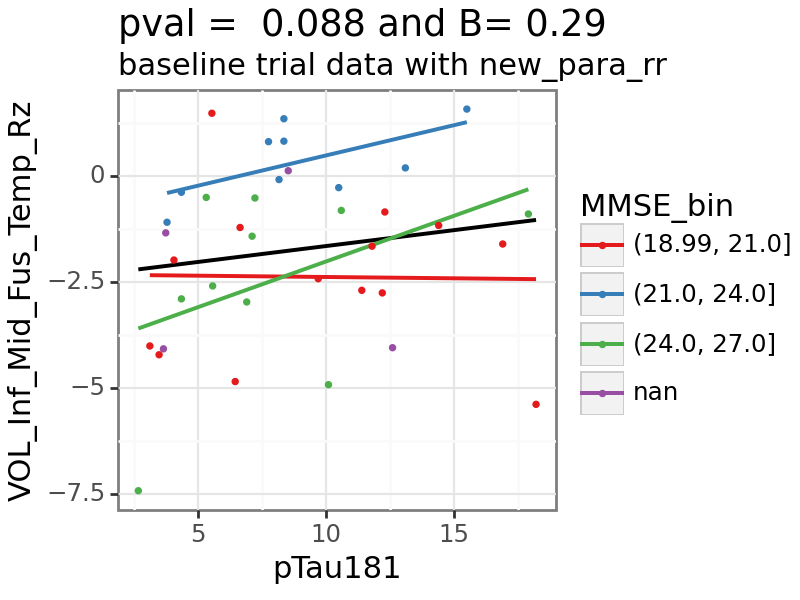

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('MMSE_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'MMSE_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all levels of Ab42/40 

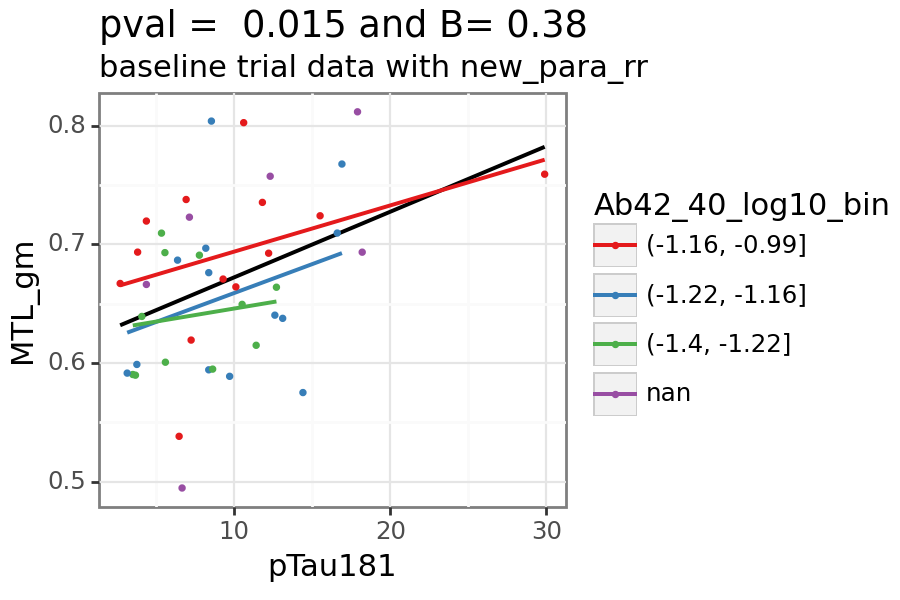

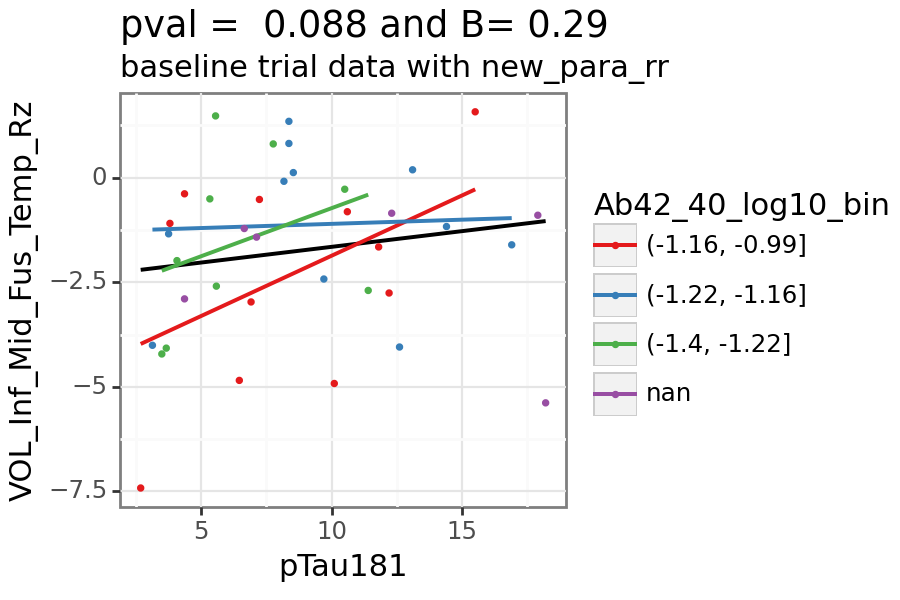

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Ab42_40_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'Ab42_40_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all levels of pTau217

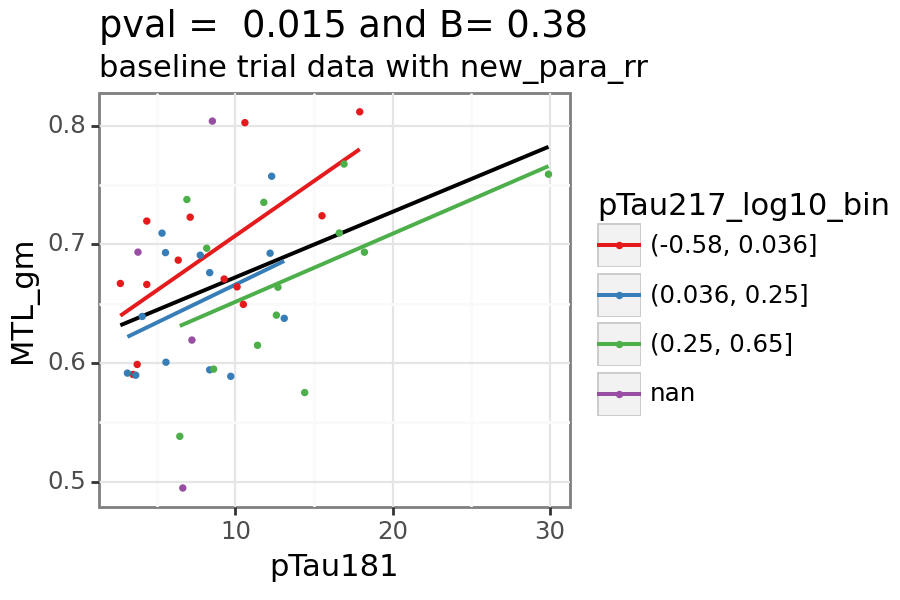

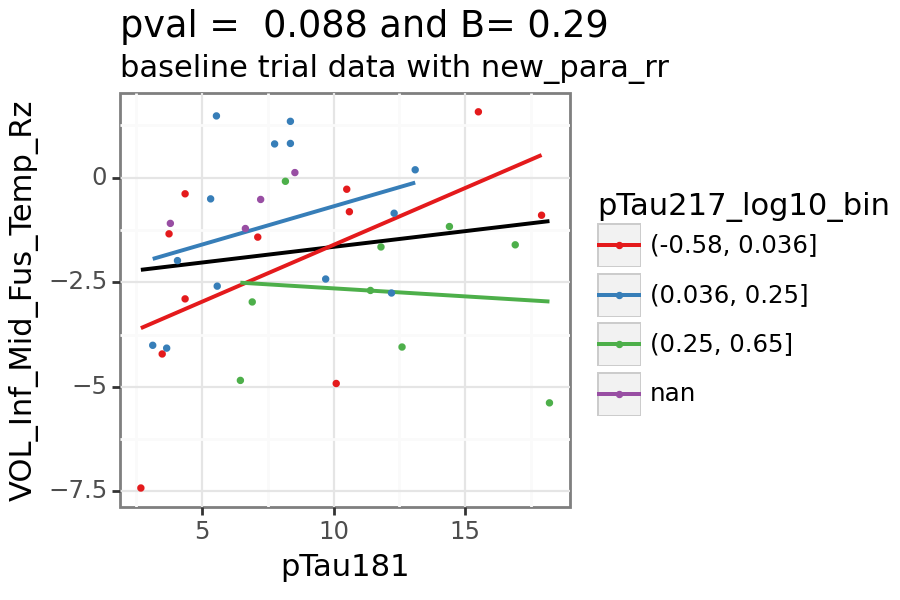

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('pTau217_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'pTau217_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all levels of GFAP

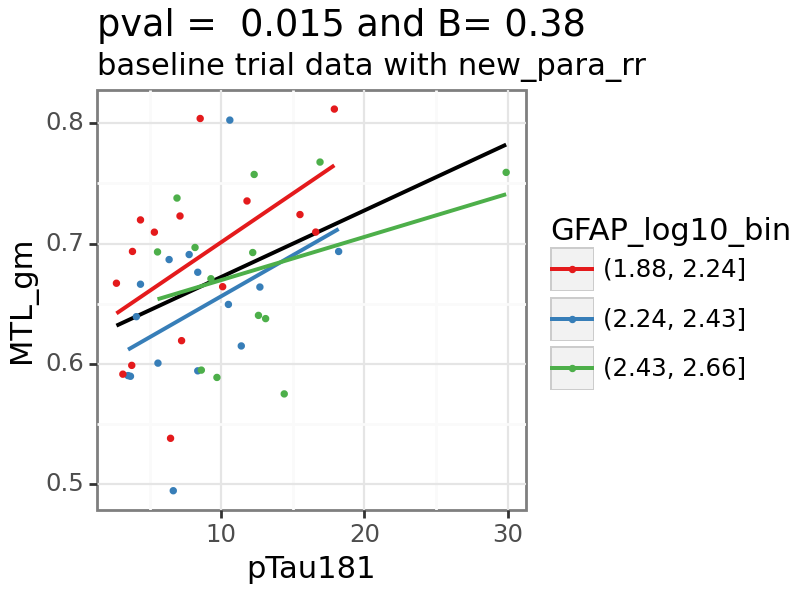

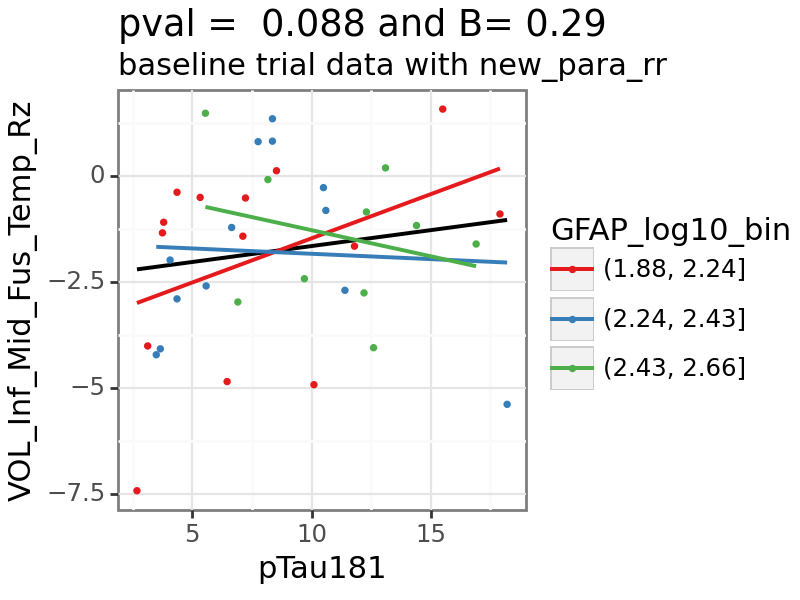

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('GFAP_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'GFAP_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all levels of NFL

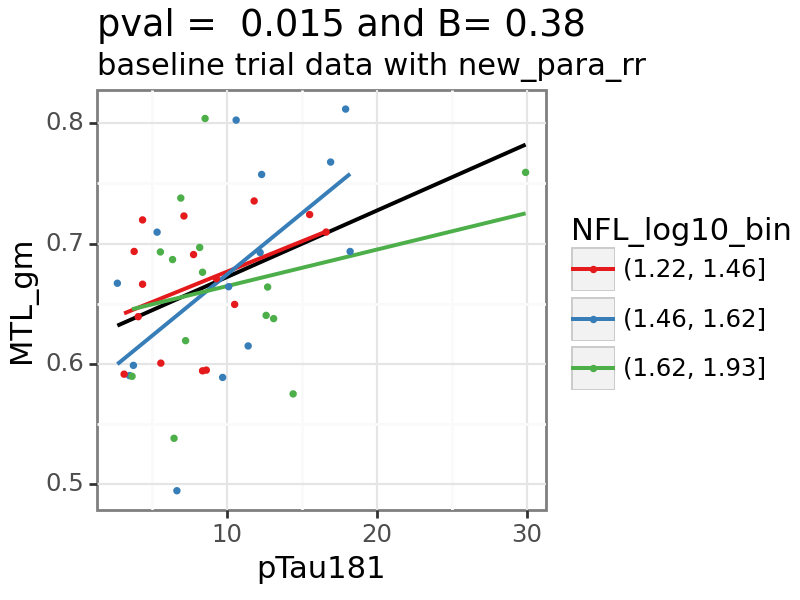

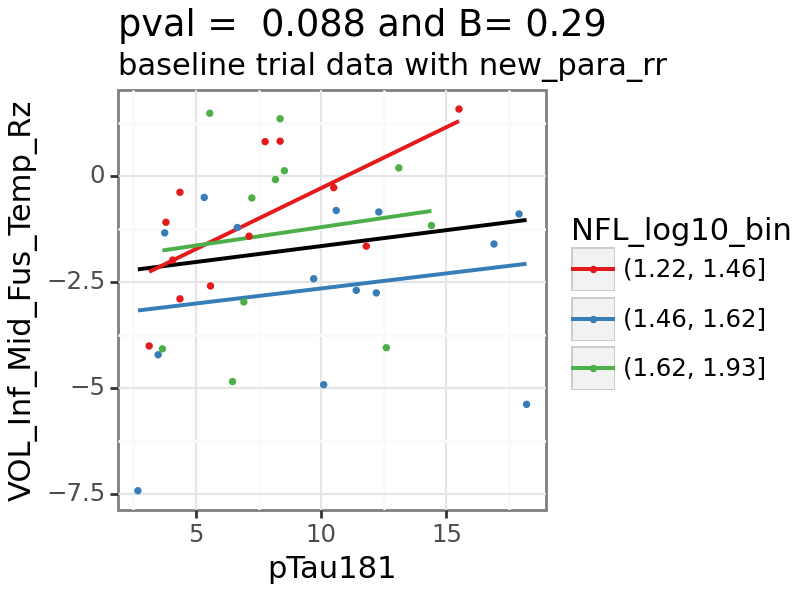

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('NFL_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'NFL_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Do we see the relationships for all levels of Hip Vol

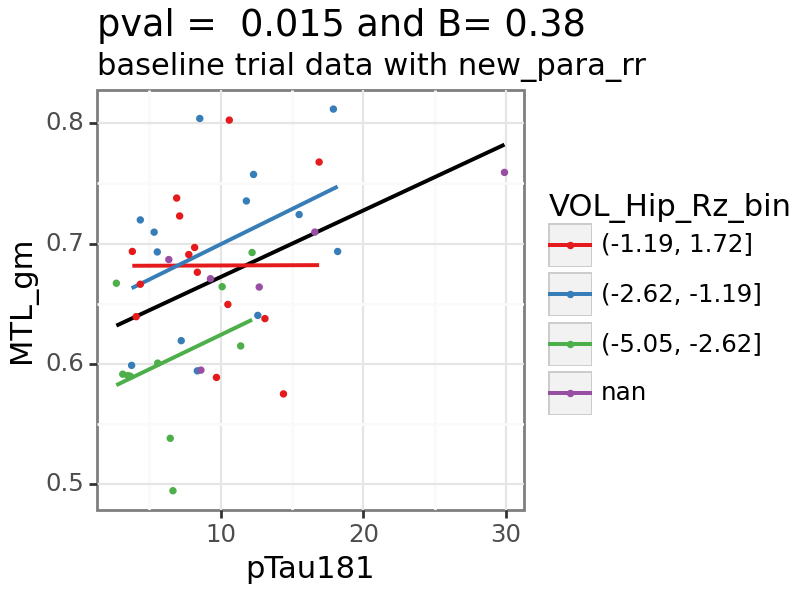

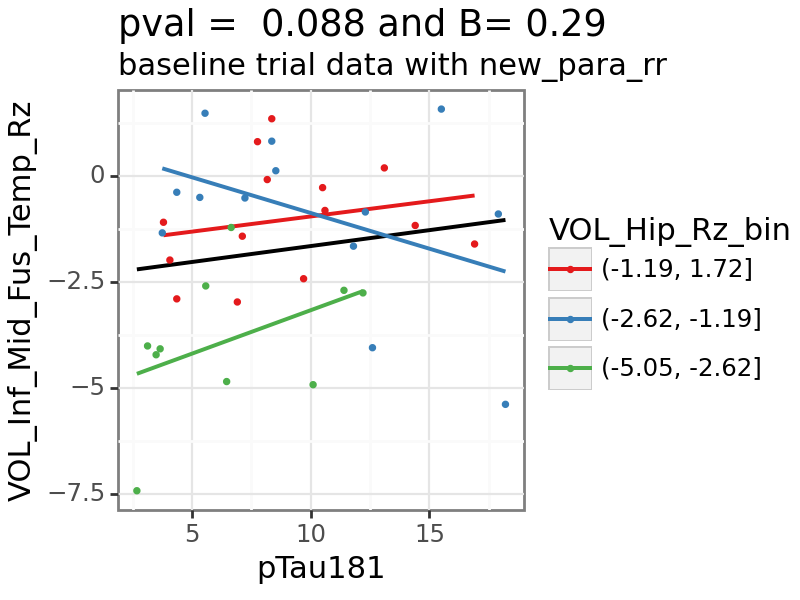

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('VOL_Hip_Rz_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'VOL_Hip_Rz_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot 181 & 231 with separate age decade lines

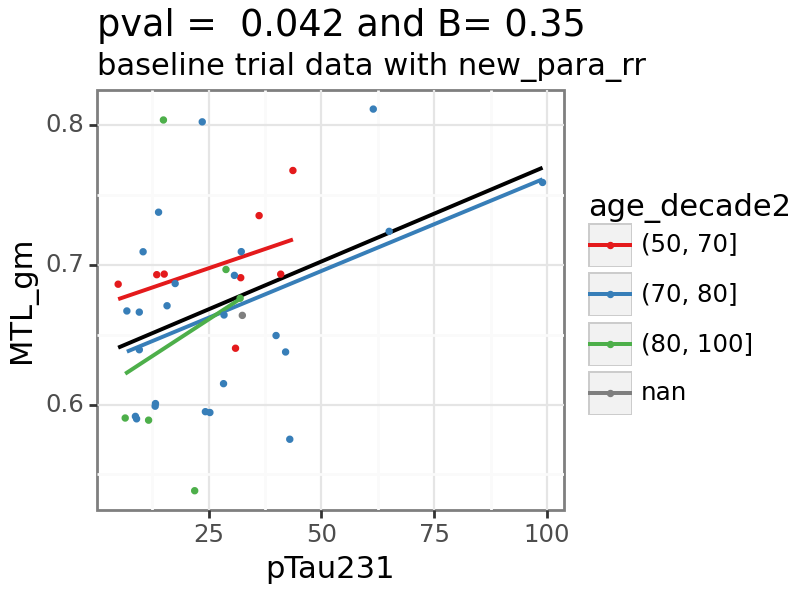

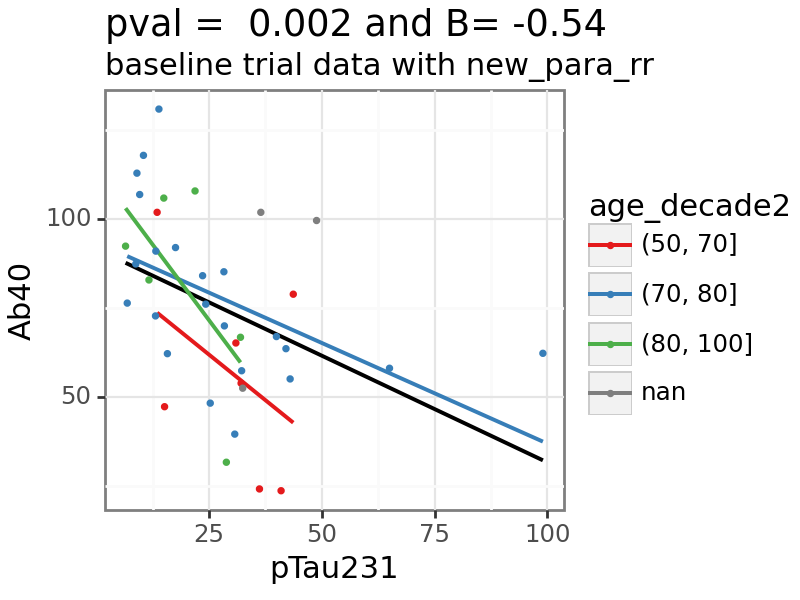

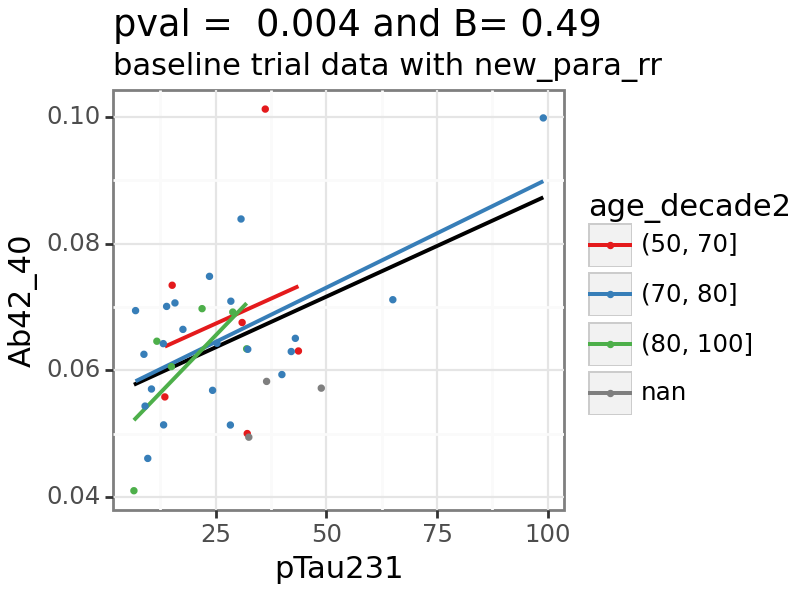

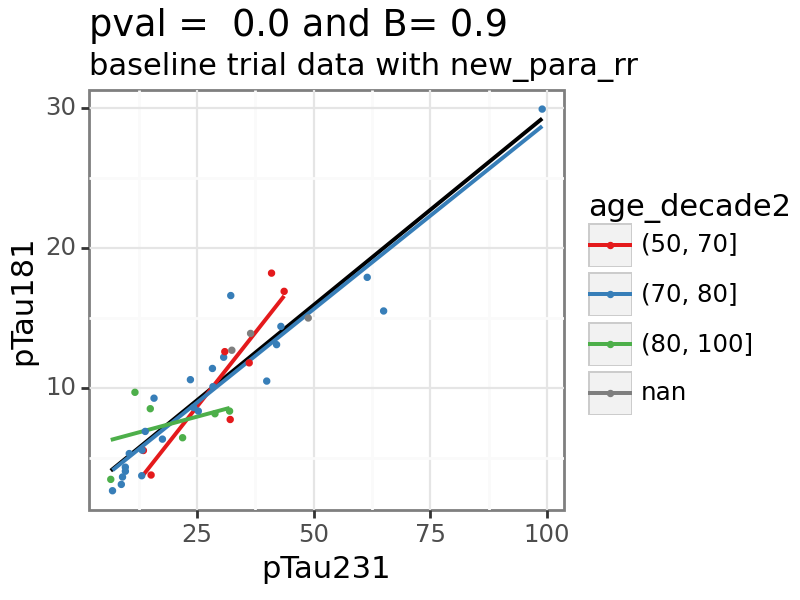

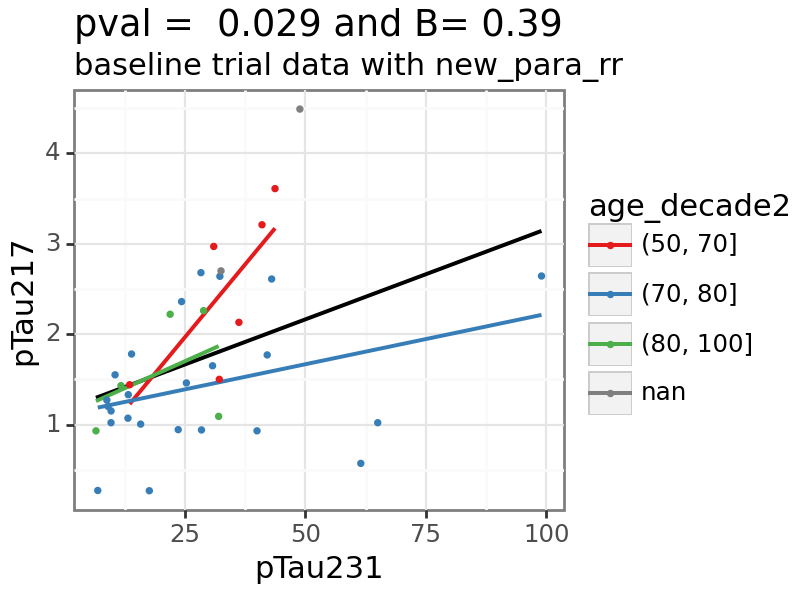

...

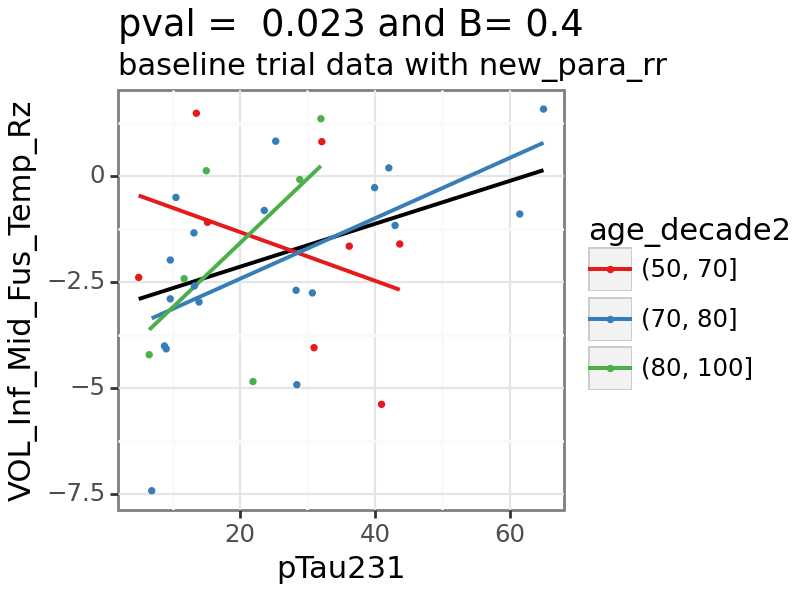

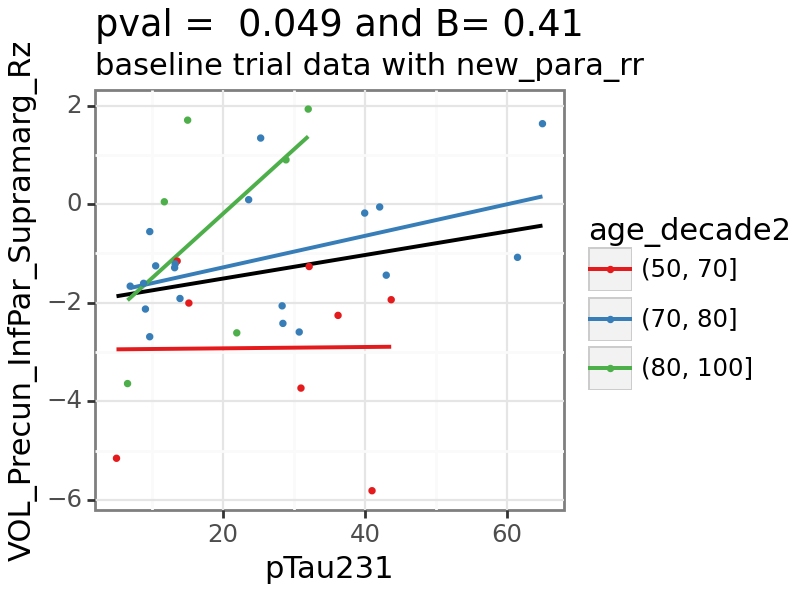

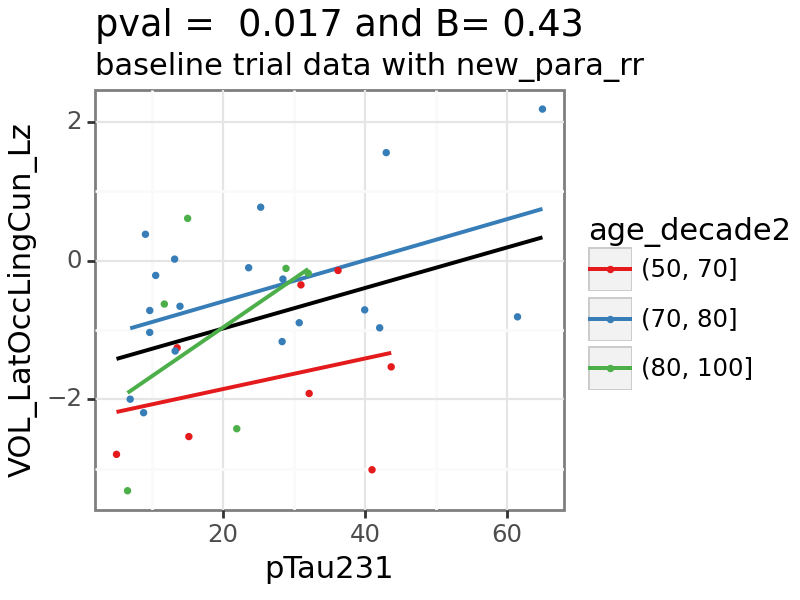

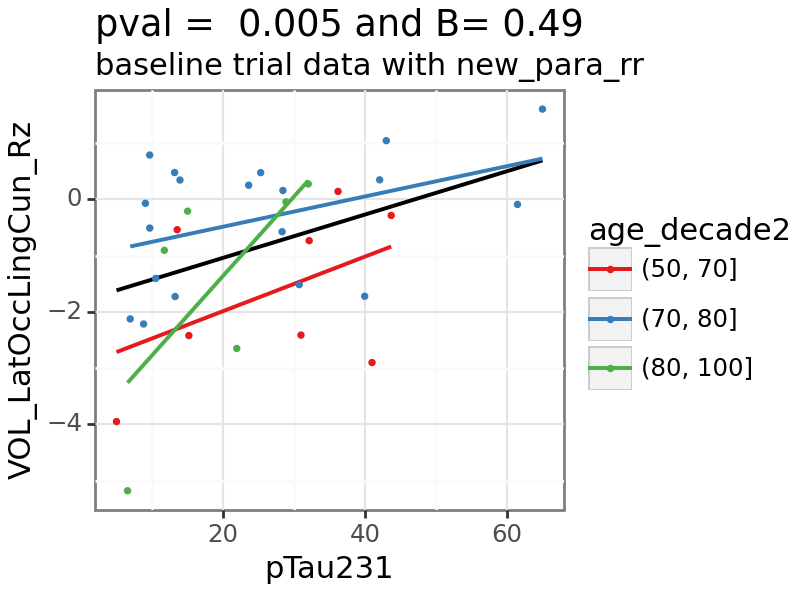

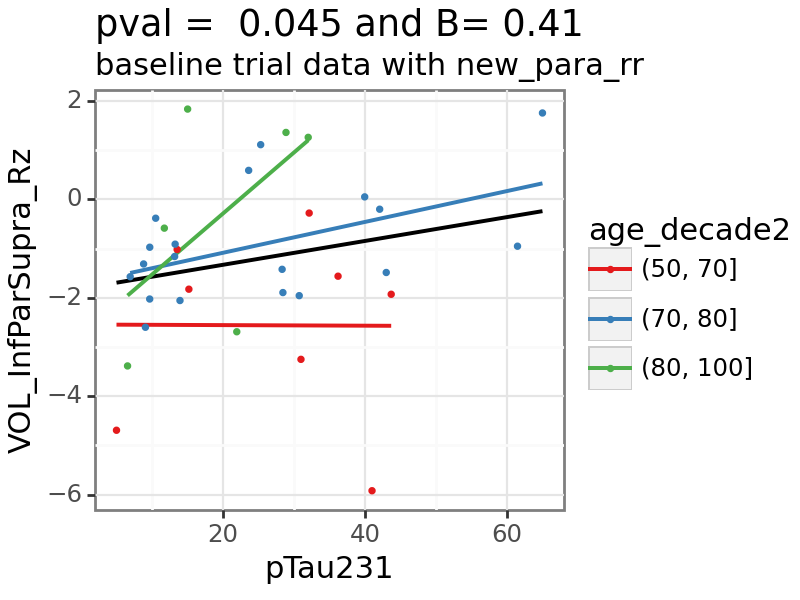

In [ ]:
var = 'pTau231'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10['mv_age_p_baseline']<0.05), 
    'var2'] 

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 4)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

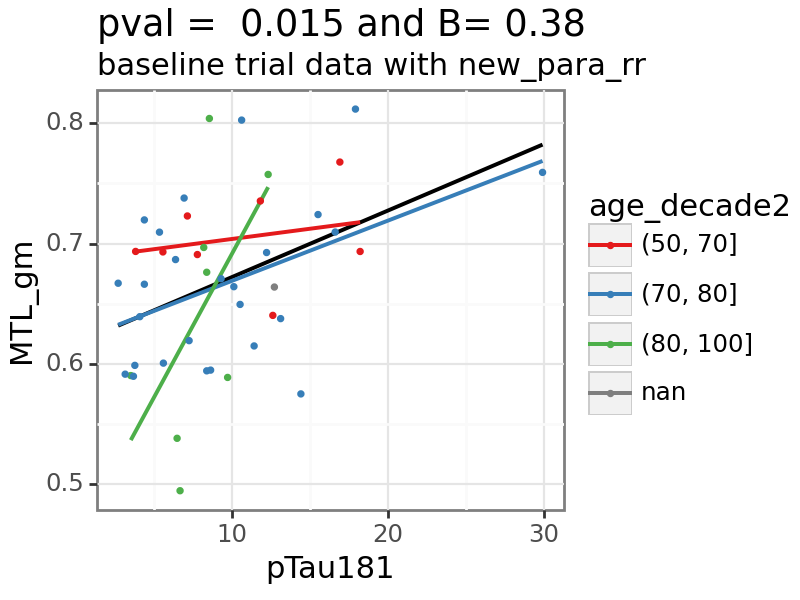

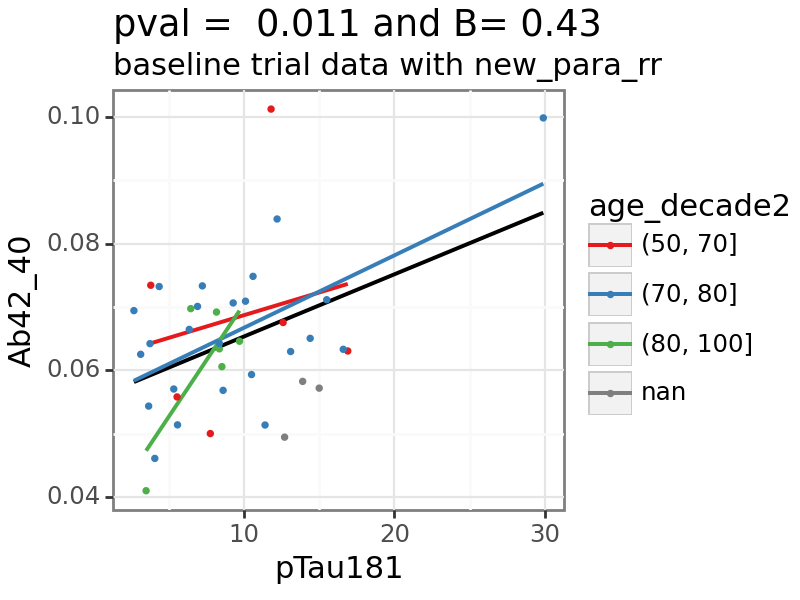

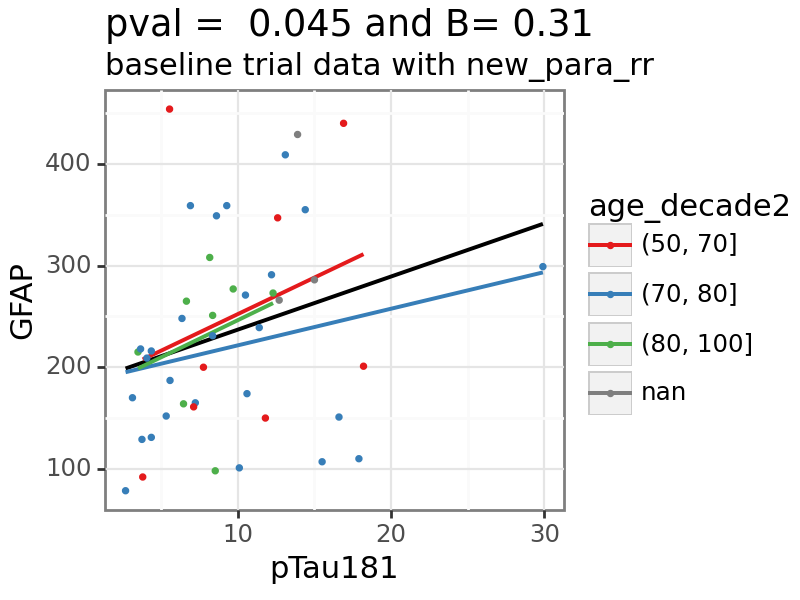

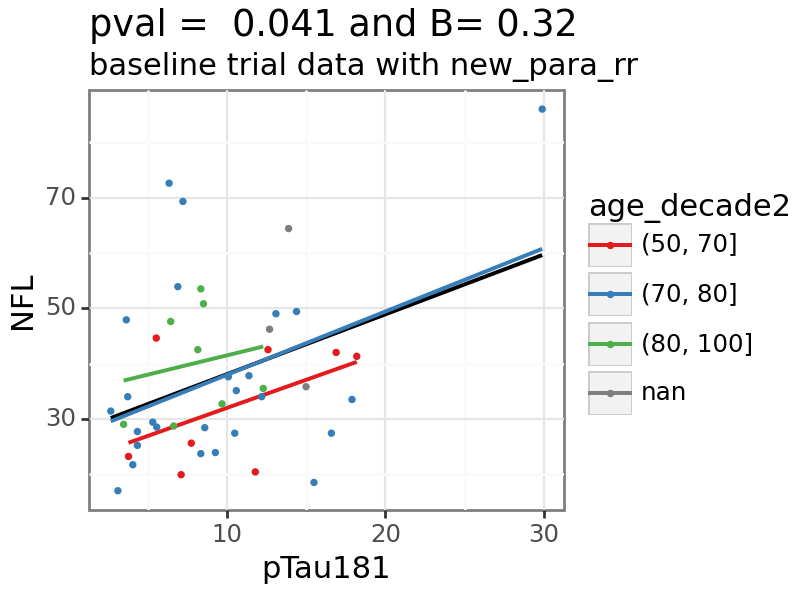

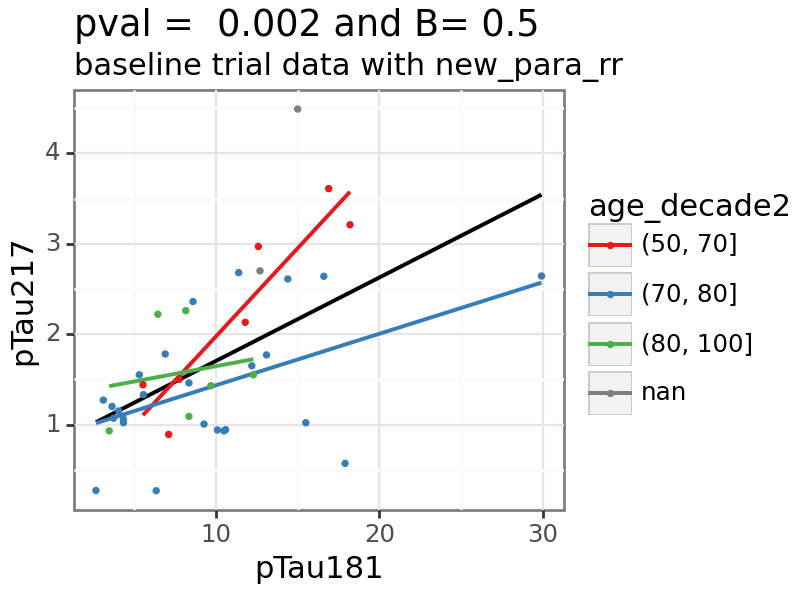

...

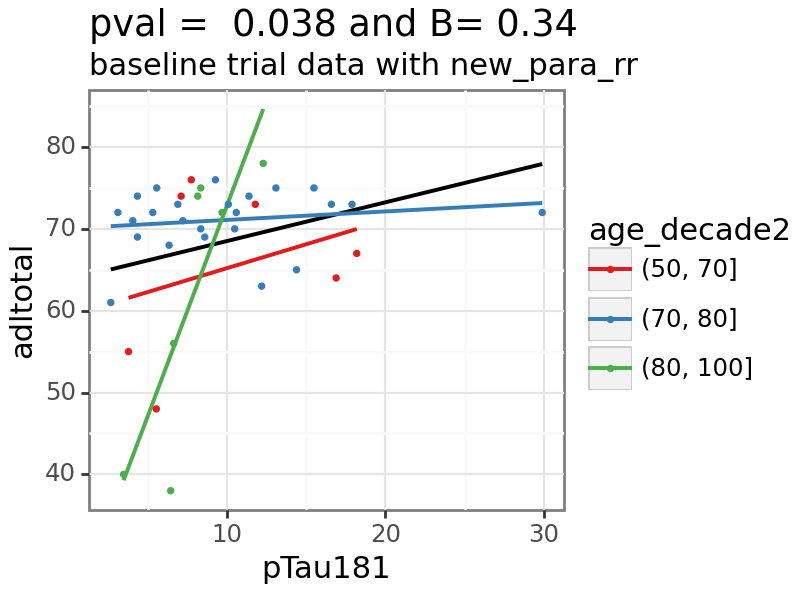

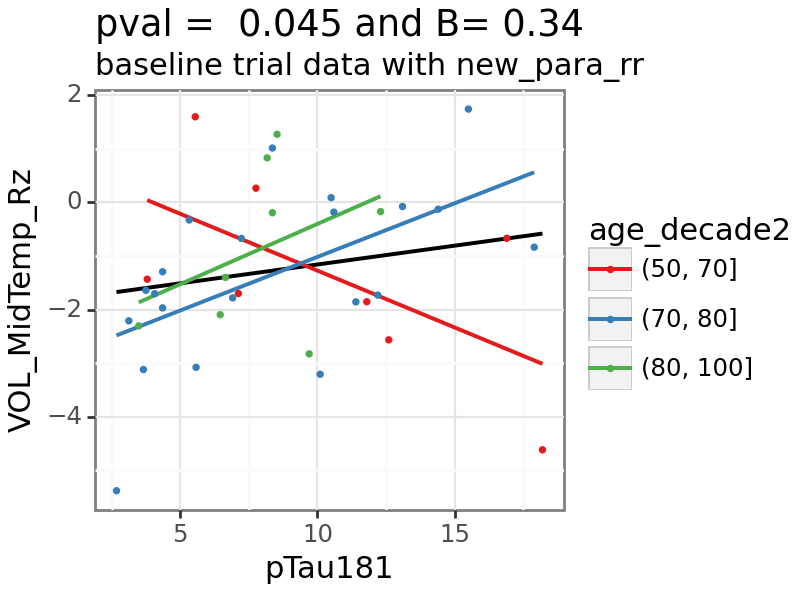

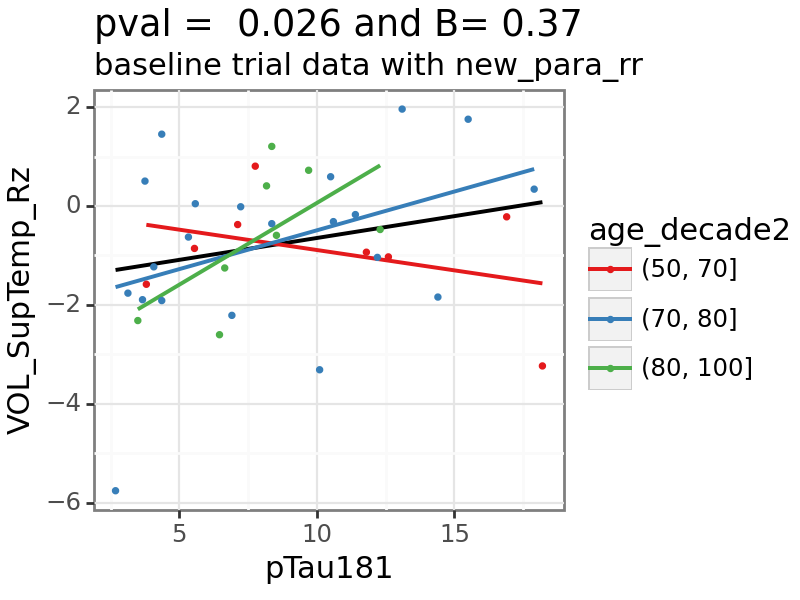

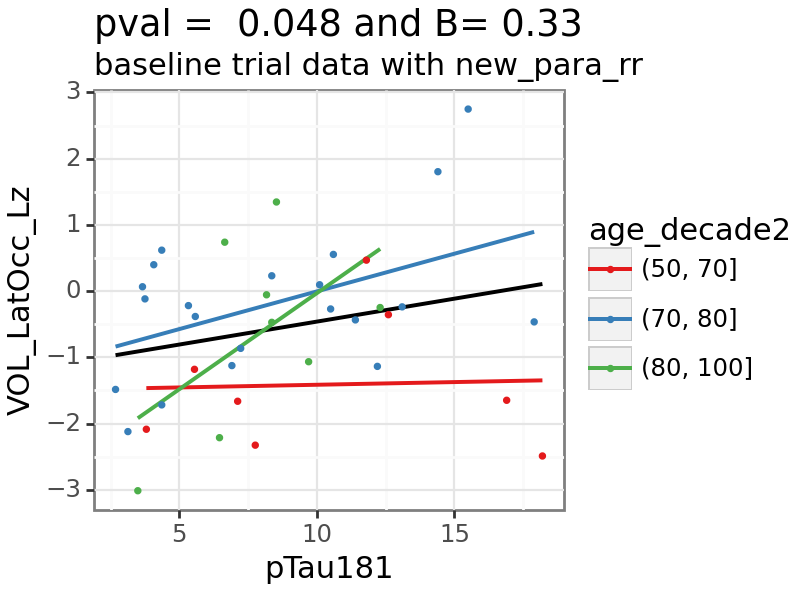

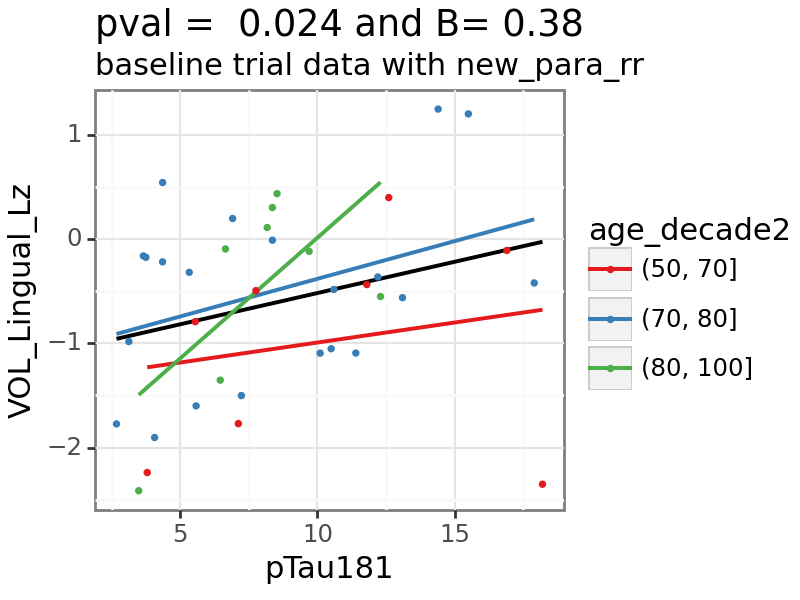

In [ ]:
var = 'pTau181'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10['mv_age_p_baseline']<0.05), 
    'var2'] 

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 5)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)